# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

adata.X = adata.layers["counts"].copy()
del adata.layers
adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
gc.collect()

12

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|dose_training",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|condition",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "dose_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(8 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['condition', 'dose_training']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "cpa_sciplex_v4_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `training` set. Number of elements in each group: 1721,1560,1429,1726,1436,1540,1425,1012
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1552,3594,2204,2778,1721
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `validation` set. Number of elements in each group: 434,401,363,445,354,400,342,223
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 387,874,556,711,434
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:13<2:14:02, 13.43s/it]

Epoch 1/600:   0%|          | 1/600 [00:13<2:14:02, 13.43s/it, v_num=1, total_loss_train=2.7e+3, kl_local_train=23.7]

Epoch 2/600:   0%|          | 1/600 [00:13<2:14:02, 13.43s/it, v_num=1, total_loss_train=2.7e+3, kl_local_train=23.7]

Epoch 2/600:   0%|          | 2/600 [00:25<2:08:47, 12.92s/it, v_num=1, total_loss_train=2.7e+3, kl_local_train=23.7]

Epoch 2/600:   0%|          | 2/600 [00:25<2:08:47, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=43.7]

Epoch 3/600:   0%|          | 2/600 [00:26<2:08:47, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=43.7]

Epoch 3/600:   0%|          | 3/600 [00:38<2:06:41, 12.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=43.7]

Epoch 3/600:   0%|          | 3/600 [00:38<2:06:41, 12.73s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=47.4]

Epoch 4/600:   0%|          | 3/600 [00:38<2:06:41, 12.73s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=47.4]

Epoch 4/600:   1%|          | 4/600 [00:51<2:05:57, 12.68s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=47.4]

Epoch 4/600:   1%|          | 4/600 [00:51<2:05:57, 12.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=48.2] 

Epoch 5/600:   1%|          | 4/600 [00:51<2:05:57, 12.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=48.2]

Epoch 5/600:   1%|          | 5/600 [01:04<2:06:59, 12.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=48.2]

Epoch 5/600:   1%|          | 5/600 [01:04<2:06:59, 12.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=47.8]

Epoch 6/600:   1%|          | 5/600 [01:04<2:06:59, 12.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=47.8]

Epoch 6/600:   1%|          | 6/600 [01:16<2:04:46, 12.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=47.8]

Epoch 6/600:   1%|          | 6/600 [01:16<2:04:46, 12.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=46.5, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 7/600:   1%|          | 6/600 [01:16<2:04:46, 12.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=46.5, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 7/600:   1%|          | 7/600 [01:28<2:02:24, 12.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=46.5, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 7/600:   1%|          | 7/600 [01:28<2:02:24, 12.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=44.3, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 8/600:   1%|          | 7/600 [01:28<2:02:24, 12.39s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=44.3, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 8/600:   1%|▏         | 8/600 [01:40<2:00:16, 12.19s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=44.3, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 8/600:   1%|▏         | 8/600 [01:40<2:00:16, 12.19s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=48.7, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 9/600:   1%|▏         | 8/600 [01:40<2:00:16, 12.19s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=48.7, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 9/600:   2%|▏         | 9/600 [01:51<1:58:34, 12.04s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=48.7, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 9/600:   2%|▏         | 9/600 [01:51<1:58:34, 12.04s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=47.5, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 10/600:   2%|▏         | 9/600 [01:51<1:58:34, 12.04s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=47.5, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 10/600:   2%|▏         | 10/600 [02:03<1:58:37, 12.06s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=47.5, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 10/600:   2%|▏         | 10/600 [02:03<1:58:37, 12.06s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=43.2, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 11/600:   2%|▏         | 10/600 [02:04<1:58:37, 12.06s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=43.2, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 11/600:   2%|▏         | 11/600 [02:16<1:58:44, 12.10s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=43.2, metric_mi|dose_training_train=0.0376, metric_mi|condition_train=0.0286]

Epoch 11/600:   2%|▏         | 11/600 [02:16<1:58:44, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=37.3, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 12/600:   2%|▏         | 11/600 [02:16<1:58:44, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=37.3, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 12/600:   2%|▏         | 12/600 [02:27<1:57:37, 12.00s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=37.3, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 12/600:   2%|▏         | 12/600 [02:27<1:57:37, 12.00s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=32.9, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 13/600:   2%|▏         | 12/600 [02:27<1:57:37, 12.00s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=32.9, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 13/600:   2%|▏         | 13/600 [02:39<1:56:59, 11.96s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=32.9, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 13/600:   2%|▏         | 13/600 [02:39<1:56:59, 11.96s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=27.4, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 14/600:   2%|▏         | 13/600 [02:39<1:56:59, 11.96s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=27.4, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 14/600:   2%|▏         | 14/600 [02:51<1:55:41, 11.85s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=27.4, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 14/600:   2%|▏         | 14/600 [02:51<1:55:41, 11.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=26.2, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 15/600:   2%|▏         | 14/600 [02:51<1:55:41, 11.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=26.2, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 15/600:   2%|▎         | 15/600 [03:03<1:55:53, 11.89s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=26.2, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 15/600:   2%|▎         | 15/600 [03:03<1:55:53, 11.89s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=27, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]  

Epoch 16/600:   2%|▎         | 15/600 [03:03<1:55:53, 11.89s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=27, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 16/600:   3%|▎         | 16/600 [03:15<1:55:59, 11.92s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=27, metric_mi|dose_training_train=0.0385, metric_mi|condition_train=0.0289]

Epoch 16/600:   3%|▎         | 16/600 [03:15<1:55:59, 11.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=30, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813] 

Epoch 17/600:   3%|▎         | 16/600 [03:15<1:55:59, 11.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=30, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 17/600:   3%|▎         | 17/600 [03:26<1:54:54, 11.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=30, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 17/600:   3%|▎         | 17/600 [03:26<1:54:54, 11.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=33.8, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 18/600:   3%|▎         | 17/600 [03:26<1:54:54, 11.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=33.8, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 18/600:   3%|▎         | 18/600 [03:38<1:54:29, 11.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=33.8, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 18/600:   3%|▎         | 18/600 [03:38<1:54:29, 11.80s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=37.2, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 19/600:   3%|▎         | 18/600 [03:38<1:54:29, 11.80s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=37.2, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 19/600:   3%|▎         | 19/600 [03:50<1:54:06, 11.78s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=37.2, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 19/600:   3%|▎         | 19/600 [03:50<1:54:06, 11.78s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=41.8, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 20/600:   3%|▎         | 19/600 [03:50<1:54:06, 11.78s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=41.8, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 20/600:   3%|▎         | 20/600 [04:02<1:54:46, 11.87s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=41.8, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 20/600:   3%|▎         | 20/600 [04:02<1:54:46, 11.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=46.5, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 21/600:   3%|▎         | 20/600 [04:02<1:54:46, 11.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=46.5, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 21/600:   4%|▎         | 21/600 [04:14<1:54:35, 11.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=46.5, metric_mi|dose_training_train=0.045, metric_mi|condition_train=0.0813]

Epoch 21/600:   4%|▎         | 21/600 [04:14<1:54:35, 11.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=52.9, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13] 

Epoch 22/600:   4%|▎         | 21/600 [04:14<1:54:35, 11.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=52.9, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 22/600:   4%|▎         | 22/600 [04:25<1:53:26, 11.78s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=52.9, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 22/600:   4%|▎         | 22/600 [04:25<1:53:26, 11.78s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=56.4, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 23/600:   4%|▎         | 22/600 [04:25<1:53:26, 11.78s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=56.4, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 23/600:   4%|▍         | 23/600 [04:37<1:52:53, 11.74s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=56.4, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 23/600:   4%|▍         | 23/600 [04:37<1:52:53, 11.74s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=56.2, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 24/600:   4%|▍         | 23/600 [04:37<1:52:53, 11.74s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=56.2, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 24/600:   4%|▍         | 24/600 [04:49<1:52:23, 11.71s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=56.2, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 24/600:   4%|▍         | 24/600 [04:49<1:52:23, 11.71s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=57.9, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 25/600:   4%|▍         | 24/600 [04:49<1:52:23, 11.71s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=57.9, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 25/600:   4%|▍         | 25/600 [05:01<1:54:01, 11.90s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=57.9, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 25/600:   4%|▍         | 25/600 [05:01<1:54:01, 11.90s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 26/600:   4%|▍         | 25/600 [05:01<1:54:01, 11.90s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 26/600:   4%|▍         | 26/600 [05:13<1:54:24, 11.96s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0532, metric_mi|condition_train=0.13]

Epoch 26/600:   4%|▍         | 26/600 [05:13<1:54:24, 11.96s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=58.1, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 27/600:   4%|▍         | 26/600 [05:13<1:54:24, 11.96s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=58.1, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 27/600:   4%|▍         | 27/600 [05:25<1:53:47, 11.92s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=58.1, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 27/600:   4%|▍         | 27/600 [05:25<1:53:47, 11.92s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=61, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]  

Epoch 28/600:   4%|▍         | 27/600 [05:25<1:53:47, 11.92s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=61, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 28/600:   5%|▍         | 28/600 [05:37<1:52:53, 11.84s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=61, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 28/600:   5%|▍         | 28/600 [05:37<1:52:53, 11.84s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 29/600:   5%|▍         | 28/600 [05:37<1:52:53, 11.84s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 29/600:   5%|▍         | 29/600 [05:48<1:52:06, 11.78s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 29/600:   5%|▍         | 29/600 [05:48<1:52:06, 11.78s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 30/600:   5%|▍         | 29/600 [05:48<1:52:06, 11.78s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 30/600:   5%|▌         | 30/600 [06:00<1:52:12, 11.81s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 30/600:   5%|▌         | 30/600 [06:00<1:52:12, 11.81s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 31/600:   5%|▌         | 30/600 [06:00<1:52:12, 11.81s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 31/600:   5%|▌         | 31/600 [06:12<1:52:20, 11.85s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.0665, metric_mi|condition_train=0.156]

Epoch 31/600:   5%|▌         | 31/600 [06:12<1:52:20, 11.85s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 32/600:   5%|▌         | 31/600 [06:12<1:52:20, 11.85s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 32/600:   5%|▌         | 32/600 [06:24<1:51:18, 11.76s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 32/600:   5%|▌         | 32/600 [06:24<1:51:18, 11.76s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=75, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]   

Epoch 33/600:   5%|▌         | 32/600 [06:24<1:51:18, 11.76s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=75, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 33/600:   6%|▌         | 33/600 [06:35<1:50:28, 11.69s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=75, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 33/600:   6%|▌         | 33/600 [06:35<1:50:28, 11.69s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 34/600:   6%|▌         | 33/600 [06:35<1:50:28, 11.69s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 34/600:   6%|▌         | 34/600 [06:47<1:50:00, 11.66s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 34/600:   6%|▌         | 34/600 [06:47<1:50:00, 11.66s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 35/600:   6%|▌         | 34/600 [06:47<1:50:00, 11.66s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 35/600:   6%|▌         | 35/600 [06:59<1:50:51, 11.77s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 35/600:   6%|▌         | 35/600 [06:59<1:50:51, 11.77s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 36/600:   6%|▌         | 35/600 [06:59<1:50:51, 11.77s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 36/600:   6%|▌         | 36/600 [07:11<1:50:59, 11.81s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.0876, metric_mi|condition_train=0.163]

Epoch 36/600:   6%|▌         | 36/600 [07:11<1:50:59, 11.81s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 37/600:   6%|▌         | 36/600 [07:11<1:50:59, 11.81s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 37/600:   6%|▌         | 37/600 [07:22<1:49:59, 11.72s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 37/600:   6%|▌         | 37/600 [07:22<1:49:59, 11.72s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=93, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]  

Epoch 38/600:   6%|▌         | 37/600 [07:22<1:49:59, 11.72s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=93, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 38/600:   6%|▋         | 38/600 [07:34<1:49:14, 11.66s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=93, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 38/600:   6%|▋         | 38/600 [07:34<1:49:14, 11.66s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 39/600:   6%|▋         | 38/600 [07:34<1:49:14, 11.66s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 39/600:   6%|▋         | 39/600 [07:45<1:48:39, 11.62s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 39/600:   6%|▋         | 39/600 [07:45<1:48:39, 11.62s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=93, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]  

Epoch 40/600:   6%|▋         | 39/600 [07:45<1:48:39, 11.62s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=93, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 40/600:   7%|▋         | 40/600 [07:57<1:49:33, 11.74s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=93, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 40/600:   7%|▋         | 40/600 [07:57<1:49:33, 11.74s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 41/600:   7%|▋         | 40/600 [07:58<1:49:33, 11.74s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 41/600:   7%|▋         | 41/600 [08:09<1:50:03, 11.81s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.0957, metric_mi|condition_train=0.172]

Epoch 41/600:   7%|▋         | 41/600 [08:09<1:50:03, 11.81s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181] 

Epoch 42/600:   7%|▋         | 41/600 [08:09<1:50:03, 11.81s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 42/600:   7%|▋         | 42/600 [08:21<1:49:14, 11.75s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 42/600:   7%|▋         | 42/600 [08:21<1:49:14, 11.75s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=103, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181] 

Epoch 43/600:   7%|▋         | 42/600 [08:21<1:49:14, 11.75s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=103, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 43/600:   7%|▋         | 43/600 [08:32<1:48:30, 11.69s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=103, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 43/600:   7%|▋         | 43/600 [08:32<1:48:30, 11.69s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=110, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 44/600:   7%|▋         | 43/600 [08:32<1:48:30, 11.69s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=110, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 44/600:   7%|▋         | 44/600 [08:44<1:47:58, 11.65s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=110, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 44/600:   7%|▋         | 44/600 [08:44<1:47:58, 11.65s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=110, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 45/600:   7%|▋         | 44/600 [08:44<1:47:58, 11.65s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=110, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 45/600:   8%|▊         | 45/600 [08:56<1:48:35, 11.74s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=110, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 45/600:   8%|▊         | 45/600 [08:56<1:48:35, 11.74s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=113, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 46/600:   8%|▊         | 45/600 [08:56<1:48:35, 11.74s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=113, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 46/600:   8%|▊         | 46/600 [09:06<1:44:33, 11.32s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=113, metric_mi|dose_training_train=0.108, metric_mi|condition_train=0.181]

Epoch 46/600:   8%|▊         | 46/600 [09:06<1:44:33, 11.32s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=117, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 47/600:   8%|▊         | 46/600 [09:06<1:44:33, 11.32s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=117, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 47/600:   8%|▊         | 47/600 [09:16<1:40:44, 10.93s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=117, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 47/600:   8%|▊         | 47/600 [09:16<1:40:44, 10.93s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=118, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 48/600:   8%|▊         | 47/600 [09:16<1:40:44, 10.93s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=118, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 48/600:   8%|▊         | 48/600 [09:26<1:38:30, 10.71s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=118, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 48/600:   8%|▊         | 48/600 [09:26<1:38:30, 10.71s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=124, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 49/600:   8%|▊         | 48/600 [09:26<1:38:30, 10.71s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=124, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 49/600:   8%|▊         | 49/600 [09:36<1:36:19, 10.49s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=124, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 49/600:   8%|▊         | 49/600 [09:36<1:36:19, 10.49s/it, v_num=1, total_loss_train=2.36e+3, kl_local_train=124, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 50/600:   8%|▊         | 49/600 [09:36<1:36:19, 10.49s/it, v_num=1, total_loss_train=2.36e+3, kl_local_train=124, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 50/600:   8%|▊         | 50/600 [09:47<1:36:28, 10.52s/it, v_num=1, total_loss_train=2.36e+3, kl_local_train=124, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 50/600:   8%|▊         | 50/600 [09:47<1:36:28, 10.52s/it, v_num=1, total_loss_train=2.36e+3, kl_local_train=127, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 51/600:   8%|▊         | 50/600 [09:47<1:36:28, 10.52s/it, v_num=1, total_loss_train=2.36e+3, kl_local_train=127, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 51/600:   8%|▊         | 51/600 [09:59<1:40:39, 11.00s/it, v_num=1, total_loss_train=2.36e+3, kl_local_train=127, metric_mi|dose_training_train=0.118, metric_mi|condition_train=0.184]

Epoch 51/600:   8%|▊         | 51/600 [09:59<1:40:39, 11.00s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=126, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 52/600:   8%|▊         | 51/600 [09:59<1:40:39, 11.00s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=126, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 52/600:   9%|▊         | 52/600 [10:11<1:42:04, 11.18s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=126, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 52/600:   9%|▊         | 52/600 [10:11<1:42:04, 11.18s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=129, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 53/600:   9%|▊         | 52/600 [10:11<1:42:04, 11.18s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=129, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 53/600:   9%|▉         | 53/600 [10:22<1:43:04, 11.31s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=129, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 53/600:   9%|▉         | 53/600 [10:22<1:43:04, 11.31s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=130, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 54/600:   9%|▉         | 53/600 [10:22<1:43:04, 11.31s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=130, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 54/600:   9%|▉         | 54/600 [10:34<1:43:36, 11.39s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=130, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 54/600:   9%|▉         | 54/600 [10:34<1:43:36, 11.39s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=132, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 55/600:   9%|▉         | 54/600 [10:34<1:43:36, 11.39s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=132, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 55/600:   9%|▉         | 55/600 [10:46<1:46:03, 11.68s/it, v_num=1, total_loss_train=2.35e+3, kl_local_train=132, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 55/600:   9%|▉         | 55/600 [10:46<1:46:03, 11.68s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=138, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 56/600:   9%|▉         | 55/600 [10:47<1:46:03, 11.68s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=138, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 56/600:   9%|▉         | 56/600 [10:58<1:47:22, 11.84s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=138, metric_mi|dose_training_train=0.131, metric_mi|condition_train=0.191]

Epoch 56/600:   9%|▉         | 56/600 [10:58<1:47:22, 11.84s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 57/600:   9%|▉         | 56/600 [10:58<1:47:22, 11.84s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 57/600:  10%|▉         | 57/600 [11:10<1:46:56, 11.82s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 57/600:  10%|▉         | 57/600 [11:10<1:46:56, 11.82s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=138, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 58/600:  10%|▉         | 57/600 [11:10<1:46:56, 11.82s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=138, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 58/600:  10%|▉         | 58/600 [11:22<1:46:27, 11.79s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=138, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 58/600:  10%|▉         | 58/600 [11:22<1:46:27, 11.79s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 59/600:  10%|▉         | 58/600 [11:22<1:46:27, 11.79s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 59/600:  10%|▉         | 59/600 [11:34<1:46:27, 11.81s/it, v_num=1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 59/600:  10%|▉         | 59/600 [11:34<1:46:27, 11.81s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=144, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 60/600:  10%|▉         | 59/600 [11:34<1:46:27, 11.81s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=144, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 60/600:  10%|█         | 60/600 [11:46<1:48:21, 12.04s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=144, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 60/600:  10%|█         | 60/600 [11:46<1:48:21, 12.04s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=146, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 61/600:  10%|█         | 60/600 [11:47<1:48:21, 12.04s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=146, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 61/600:  10%|█         | 61/600 [11:59<1:48:33, 12.08s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=146, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.199]

Epoch 61/600:  10%|█         | 61/600 [11:59<1:48:33, 12.08s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=146, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 62/600:  10%|█         | 61/600 [11:59<1:48:33, 12.08s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=146, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 62/600:  10%|█         | 62/600 [12:11<1:48:05, 12.05s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=146, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 62/600:  10%|█         | 62/600 [12:11<1:48:05, 12.05s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=147, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 63/600:  10%|█         | 62/600 [12:11<1:48:05, 12.05s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=147, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 63/600:  10%|█         | 63/600 [12:22<1:47:37, 12.03s/it, v_num=1, total_loss_train=2.33e+3, kl_local_train=147, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 63/600:  10%|█         | 63/600 [12:22<1:47:37, 12.03s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=146, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 64/600:  10%|█         | 63/600 [12:22<1:47:37, 12.03s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=146, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 64/600:  11%|█         | 64/600 [12:34<1:47:04, 11.99s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=146, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 64/600:  11%|█         | 64/600 [12:34<1:47:04, 11.99s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=150, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 65/600:  11%|█         | 64/600 [12:34<1:47:04, 11.99s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=150, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 65/600:  11%|█         | 65/600 [12:47<1:48:15, 12.14s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=150, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 65/600:  11%|█         | 65/600 [12:47<1:48:15, 12.14s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=153, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 66/600:  11%|█         | 65/600 [12:47<1:48:15, 12.14s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=153, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 66/600:  11%|█         | 66/600 [12:59<1:48:25, 12.18s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=153, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.211]

Epoch 66/600:  11%|█         | 66/600 [12:59<1:48:25, 12.18s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=151, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22] 

Epoch 67/600:  11%|█         | 66/600 [12:59<1:48:25, 12.18s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=151, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 67/600:  11%|█         | 67/600 [13:11<1:47:47, 12.13s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=151, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 67/600:  11%|█         | 67/600 [13:11<1:47:47, 12.13s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=149, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 68/600:  11%|█         | 67/600 [13:11<1:47:47, 12.13s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=149, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 68/600:  11%|█▏        | 68/600 [13:23<1:47:10, 12.09s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=149, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 68/600:  11%|█▏        | 68/600 [13:23<1:47:10, 12.09s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=152, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 69/600:  11%|█▏        | 68/600 [13:23<1:47:10, 12.09s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=152, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 69/600:  12%|█▏        | 69/600 [13:35<1:46:32, 12.04s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=152, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 69/600:  12%|█▏        | 69/600 [13:35<1:46:32, 12.04s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=156, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 70/600:  12%|█▏        | 69/600 [13:35<1:46:32, 12.04s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=156, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 70/600:  12%|█▏        | 70/600 [13:47<1:47:06, 12.13s/it, v_num=1, total_loss_train=2.32e+3, kl_local_train=156, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 70/600:  12%|█▏        | 70/600 [13:47<1:47:06, 12.13s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=159, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 71/600:  12%|█▏        | 70/600 [13:48<1:47:06, 12.13s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=159, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 71/600:  12%|█▏        | 71/600 [14:00<1:47:02, 12.14s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=159, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.22]

Epoch 71/600:  12%|█▏        | 71/600 [14:00<1:47:02, 12.14s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=159, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 72/600:  12%|█▏        | 71/600 [14:00<1:47:02, 12.14s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=159, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 72/600:  12%|█▏        | 72/600 [14:12<1:46:35, 12.11s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=159, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 72/600:  12%|█▏        | 72/600 [14:12<1:46:35, 12.11s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=161, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 73/600:  12%|█▏        | 72/600 [14:12<1:46:35, 12.11s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=161, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 73/600:  12%|█▏        | 73/600 [14:24<1:45:58, 12.06s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=161, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 73/600:  12%|█▏        | 73/600 [14:24<1:45:58, 12.06s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 74/600:  12%|█▏        | 73/600 [14:24<1:45:58, 12.06s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 74/600:  12%|█▏        | 74/600 [14:35<1:45:21, 12.02s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 74/600:  12%|█▏        | 74/600 [14:36<1:45:21, 12.02s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=164, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 75/600:  12%|█▏        | 74/600 [14:36<1:45:21, 12.02s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=164, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 75/600:  12%|█▎        | 75/600 [14:48<1:45:57, 12.11s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=164, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 75/600:  12%|█▎        | 75/600 [14:48<1:45:57, 12.11s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=167, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 76/600:  12%|█▎        | 75/600 [14:48<1:45:57, 12.11s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=167, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 76/600:  13%|█▎        | 76/600 [15:00<1:45:50, 12.12s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=167, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.227]

Epoch 76/600:  13%|█▎        | 76/600 [15:00<1:45:50, 12.12s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=168, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 77/600:  13%|█▎        | 76/600 [15:00<1:45:50, 12.12s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=168, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 77/600:  13%|█▎        | 77/600 [15:12<1:45:16, 12.08s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=168, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 77/600:  13%|█▎        | 77/600 [15:12<1:45:16, 12.08s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=162, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 78/600:  13%|█▎        | 77/600 [15:12<1:45:16, 12.08s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=162, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 78/600:  13%|█▎        | 78/600 [15:24<1:44:44, 12.04s/it, v_num=1, total_loss_train=2.31e+3, kl_local_train=162, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 78/600:  13%|█▎        | 78/600 [15:24<1:44:44, 12.04s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228] 

Epoch 79/600:  13%|█▎        | 78/600 [15:24<1:44:44, 12.04s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 79/600:  13%|█▎        | 79/600 [15:36<1:44:04, 11.99s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 79/600:  13%|█▎        | 79/600 [15:36<1:44:04, 11.99s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=164, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 80/600:  13%|█▎        | 79/600 [15:36<1:44:04, 11.99s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=164, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 80/600:  13%|█▎        | 80/600 [15:48<1:44:47, 12.09s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=164, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 80/600:  13%|█▎        | 80/600 [15:48<1:44:47, 12.09s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 81/600:  13%|█▎        | 80/600 [15:49<1:44:47, 12.09s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 81/600:  14%|█▎        | 81/600 [16:00<1:44:49, 12.12s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.228]

Epoch 81/600:  14%|█▎        | 81/600 [16:00<1:44:49, 12.12s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=162, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232] 

Epoch 82/600:  14%|█▎        | 81/600 [16:00<1:44:49, 12.12s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=162, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 82/600:  14%|█▎        | 82/600 [16:12<1:43:59, 12.05s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=162, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 82/600:  14%|█▎        | 82/600 [16:12<1:43:59, 12.05s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 83/600:  14%|█▎        | 82/600 [16:12<1:43:59, 12.05s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 83/600:  14%|█▍        | 83/600 [16:24<1:43:18, 11.99s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=163, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 83/600:  14%|█▍        | 83/600 [16:24<1:43:18, 11.99s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=161, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 84/600:  14%|█▍        | 83/600 [16:24<1:43:18, 11.99s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=161, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 84/600:  14%|█▍        | 84/600 [16:36<1:42:06, 11.87s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=161, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 84/600:  14%|█▍        | 84/600 [16:36<1:42:06, 11.87s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=161, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 85/600:  14%|█▍        | 84/600 [16:36<1:42:06, 11.87s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=161, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 85/600:  14%|█▍        | 85/600 [16:47<1:41:46, 11.86s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=161, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 85/600:  14%|█▍        | 85/600 [16:47<1:41:46, 11.86s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=159, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 86/600:  14%|█▍        | 85/600 [16:48<1:41:46, 11.86s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=159, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 86/600:  14%|█▍        | 86/600 [16:59<1:41:45, 11.88s/it, v_num=1, total_loss_train=2.3e+3, kl_local_train=159, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.232]

Epoch 86/600:  14%|█▍        | 86/600 [16:59<1:41:45, 11.88s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 87/600:  14%|█▍        | 86/600 [16:59<1:41:45, 11.88s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 87/600:  14%|█▍        | 87/600 [17:11<1:40:50, 11.79s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 87/600:  14%|█▍        | 87/600 [17:11<1:40:50, 11.79s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=156, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 88/600:  14%|█▍        | 87/600 [17:11<1:40:50, 11.79s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=156, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 88/600:  15%|█▍        | 88/600 [17:23<1:40:15, 11.75s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=156, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 88/600:  15%|█▍        | 88/600 [17:23<1:40:15, 11.75s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=154, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 89/600:  15%|█▍        | 88/600 [17:23<1:40:15, 11.75s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=154, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 89/600:  15%|█▍        | 89/600 [17:34<1:39:52, 11.73s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=154, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 89/600:  15%|█▍        | 89/600 [17:34<1:39:52, 11.73s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=155, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 90/600:  15%|█▍        | 89/600 [17:34<1:39:52, 11.73s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=155, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 90/600:  15%|█▌        | 90/600 [17:46<1:40:05, 11.78s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=155, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 90/600:  15%|█▌        | 90/600 [17:46<1:40:05, 11.78s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 91/600:  15%|█▌        | 90/600 [17:47<1:40:05, 11.78s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 91/600:  15%|█▌        | 91/600 [17:58<1:40:17, 11.82s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.235]

Epoch 91/600:  15%|█▌        | 91/600 [17:58<1:40:17, 11.82s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 92/600:  15%|█▌        | 91/600 [17:58<1:40:17, 11.82s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 92/600:  15%|█▌        | 92/600 [18:10<1:39:27, 11.75s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 92/600:  15%|█▌        | 92/600 [18:10<1:39:27, 11.75s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 93/600:  15%|█▌        | 92/600 [18:10<1:39:27, 11.75s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 93/600:  16%|█▌        | 93/600 [18:21<1:38:50, 11.70s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=157, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 93/600:  16%|█▌        | 93/600 [18:21<1:38:50, 11.70s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 94/600:  16%|█▌        | 93/600 [18:21<1:38:50, 11.70s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 94/600:  16%|█▌        | 94/600 [18:33<1:38:20, 11.66s/it, v_num=1, total_loss_train=2.29e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 94/600:  16%|█▌        | 94/600 [18:33<1:38:20, 11.66s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 95/600:  16%|█▌        | 94/600 [18:33<1:38:20, 11.66s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 95/600:  16%|█▌        | 95/600 [18:45<1:39:25, 11.81s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 95/600:  16%|█▌        | 95/600 [18:45<1:39:25, 11.81s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 96/600:  16%|█▌        | 95/600 [18:45<1:39:25, 11.81s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 96/600:  16%|█▌        | 96/600 [18:57<1:39:37, 11.86s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=158, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.239]

Epoch 96/600:  16%|█▌        | 96/600 [18:57<1:39:37, 11.86s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=156, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 97/600:  16%|█▌        | 96/600 [18:57<1:39:37, 11.86s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=156, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 97/600:  16%|█▌        | 97/600 [19:09<1:38:55, 11.80s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=156, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 97/600:  16%|█▌        | 97/600 [19:09<1:38:55, 11.80s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=153, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 98/600:  16%|█▌        | 97/600 [19:09<1:38:55, 11.80s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=153, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 98/600:  16%|█▋        | 98/600 [19:20<1:38:22, 11.76s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=153, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 98/600:  16%|█▋        | 98/600 [19:20<1:38:22, 11.76s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 99/600:  16%|█▋        | 98/600 [19:20<1:38:22, 11.76s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 99/600:  16%|█▋        | 99/600 [19:32<1:37:59, 11.74s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 99/600:  16%|█▋        | 99/600 [19:32<1:37:59, 11.74s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 100/600:  16%|█▋        | 99/600 [19:32<1:37:59, 11.74s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 100/600:  17%|█▋        | 100/600 [19:44<1:39:17, 11.91s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 100/600:  17%|█▋        | 100/600 [19:44<1:39:17, 11.91s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=151, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 101/600:  17%|█▋        | 100/600 [19:45<1:39:17, 11.91s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=151, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 101/600:  17%|█▋        | 101/600 [19:56<1:39:26, 11.96s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=151, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.244]

Epoch 101/600:  17%|█▋        | 101/600 [19:56<1:39:26, 11.96s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=155, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 102/600:  17%|█▋        | 101/600 [19:56<1:39:26, 11.96s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=155, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 102/600:  17%|█▋        | 102/600 [20:08<1:38:32, 11.87s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=155, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 102/600:  17%|█▋        | 102/600 [20:08<1:38:32, 11.87s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=153, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 103/600:  17%|█▋        | 102/600 [20:08<1:38:32, 11.87s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=153, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 103/600:  17%|█▋        | 103/600 [20:20<1:37:49, 11.81s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=153, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 103/600:  17%|█▋        | 103/600 [20:20<1:37:49, 11.81s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 104/600:  17%|█▋        | 103/600 [20:20<1:37:49, 11.81s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 104/600:  17%|█▋        | 104/600 [20:31<1:37:16, 11.77s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 104/600:  17%|█▋        | 104/600 [20:31<1:37:16, 11.77s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 105/600:  17%|█▋        | 104/600 [20:31<1:37:16, 11.77s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 105/600:  18%|█▊        | 105/600 [20:43<1:37:54, 11.87s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 105/600:  18%|█▊        | 105/600 [20:43<1:37:54, 11.87s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 106/600:  18%|█▊        | 105/600 [20:44<1:37:54, 11.87s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 106/600:  18%|█▊        | 106/600 [20:55<1:38:06, 11.92s/it, v_num=1, total_loss_train=2.28e+3, kl_local_train=154, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.249]

Epoch 106/600:  18%|█▊        | 106/600 [20:55<1:38:06, 11.92s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 107/600:  18%|█▊        | 106/600 [20:56<1:38:06, 11.92s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 107/600:  18%|█▊        | 107/600 [21:07<1:37:13, 11.83s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 107/600:  18%|█▊        | 107/600 [21:07<1:37:13, 11.83s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=151, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 108/600:  18%|█▊        | 107/600 [21:07<1:37:13, 11.83s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=151, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 108/600:  18%|█▊        | 108/600 [21:19<1:36:27, 11.76s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=151, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 108/600:  18%|█▊        | 108/600 [21:19<1:36:27, 11.76s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=150, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 109/600:  18%|█▊        | 108/600 [21:19<1:36:27, 11.76s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=150, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 109/600:  18%|█▊        | 109/600 [21:30<1:35:52, 11.72s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=150, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 109/600:  18%|█▊        | 109/600 [21:30<1:35:52, 11.72s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 110/600:  18%|█▊        | 109/600 [21:30<1:35:52, 11.72s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 110/600:  18%|█▊        | 110/600 [21:42<1:36:20, 11.80s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 110/600:  18%|█▊        | 110/600 [21:42<1:36:20, 11.80s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=148, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 111/600:  18%|█▊        | 110/600 [21:43<1:36:20, 11.80s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=148, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 111/600:  18%|█▊        | 111/600 [21:54<1:36:33, 11.85s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=148, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.257]

Epoch 111/600:  18%|█▊        | 111/600 [21:54<1:36:33, 11.85s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=148, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 112/600:  18%|█▊        | 111/600 [21:54<1:36:33, 11.85s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=148, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 112/600:  19%|█▊        | 112/600 [22:06<1:35:48, 11.78s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=148, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 112/600:  19%|█▊        | 112/600 [22:06<1:35:48, 11.78s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=147, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 113/600:  19%|█▊        | 112/600 [22:06<1:35:48, 11.78s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=147, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 113/600:  19%|█▉        | 113/600 [22:18<1:35:11, 11.73s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=147, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 113/600:  19%|█▉        | 113/600 [22:18<1:35:11, 11.73s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=149, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 114/600:  19%|█▉        | 113/600 [22:18<1:35:11, 11.73s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=149, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 114/600:  19%|█▉        | 114/600 [22:29<1:34:40, 11.69s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=149, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 114/600:  19%|█▉        | 114/600 [22:29<1:34:40, 11.69s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=147, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 115/600:  19%|█▉        | 114/600 [22:29<1:34:40, 11.69s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=147, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 115/600:  19%|█▉        | 115/600 [22:41<1:35:42, 11.84s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=147, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 115/600:  19%|█▉        | 115/600 [22:41<1:35:42, 11.84s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=143, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 116/600:  19%|█▉        | 115/600 [22:42<1:35:42, 11.84s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=143, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 116/600:  19%|█▉        | 116/600 [22:53<1:35:50, 11.88s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=143, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.254]

Epoch 116/600:  19%|█▉        | 116/600 [22:53<1:35:50, 11.88s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=144, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 117/600:  19%|█▉        | 116/600 [22:53<1:35:50, 11.88s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=144, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 117/600:  20%|█▉        | 117/600 [23:05<1:34:52, 11.78s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=144, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 117/600:  20%|█▉        | 117/600 [23:05<1:34:52, 11.78s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=139, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 118/600:  20%|█▉        | 117/600 [23:05<1:34:52, 11.78s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=139, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 118/600:  20%|█▉        | 118/600 [23:16<1:34:06, 11.71s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=139, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 118/600:  20%|█▉        | 118/600 [23:16<1:34:06, 11.71s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=143, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 119/600:  20%|█▉        | 118/600 [23:16<1:34:06, 11.71s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=143, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 119/600:  20%|█▉        | 119/600 [23:28<1:33:32, 11.67s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=143, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 119/600:  20%|█▉        | 119/600 [23:28<1:33:32, 11.67s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=144, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 120/600:  20%|█▉        | 119/600 [23:28<1:33:32, 11.67s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=144, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 120/600:  20%|██        | 120/600 [23:39<1:31:29, 11.44s/it, v_num=1, total_loss_train=2.27e+3, kl_local_train=144, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 120/600:  20%|██        | 120/600 [23:39<1:31:29, 11.44s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=145, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 121/600:  20%|██        | 120/600 [23:39<1:31:29, 11.44s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=145, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 121/600:  20%|██        | 121/600 [23:49<1:28:32, 11.09s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=145, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.259]

Epoch 121/600:  20%|██        | 121/600 [23:49<1:28:32, 11.09s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266] 

Epoch 122/600:  20%|██        | 121/600 [23:49<1:28:32, 11.09s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 122/600:  20%|██        | 122/600 [23:59<1:25:28, 10.73s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 122/600:  20%|██        | 122/600 [23:59<1:25:28, 10.73s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 123/600:  20%|██        | 122/600 [23:59<1:25:28, 10.73s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 123/600:  20%|██        | 123/600 [24:09<1:23:18, 10.48s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 123/600:  20%|██        | 123/600 [24:09<1:23:18, 10.48s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 124/600:  20%|██        | 123/600 [24:09<1:23:18, 10.48s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 124/600:  21%|██        | 124/600 [24:19<1:21:42, 10.30s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 124/600:  21%|██        | 124/600 [24:19<1:21:42, 10.30s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 125/600:  21%|██        | 124/600 [24:19<1:21:42, 10.30s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 125/600:  21%|██        | 125/600 [24:29<1:21:41, 10.32s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 125/600:  21%|██        | 125/600 [24:29<1:21:41, 10.32s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=141, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 126/600:  21%|██        | 125/600 [24:30<1:21:41, 10.32s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=141, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 126/600:  21%|██        | 126/600 [24:39<1:21:16, 10.29s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=141, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.266]

Epoch 126/600:  21%|██        | 126/600 [24:39<1:21:16, 10.29s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 127/600:  21%|██        | 126/600 [24:39<1:21:16, 10.29s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 127/600:  21%|██        | 127/600 [24:49<1:20:35, 10.22s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 127/600:  21%|██        | 127/600 [24:49<1:20:35, 10.22s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=141, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 128/600:  21%|██        | 127/600 [24:49<1:20:35, 10.22s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=141, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 128/600:  21%|██▏       | 128/600 [24:59<1:19:39, 10.13s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=141, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 128/600:  21%|██▏       | 128/600 [24:59<1:19:39, 10.13s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 129/600:  21%|██▏       | 128/600 [24:59<1:19:39, 10.13s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 129/600:  22%|██▏       | 129/600 [25:09<1:18:57, 10.06s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 129/600:  22%|██▏       | 129/600 [25:09<1:18:57, 10.06s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=138, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 130/600:  22%|██▏       | 129/600 [25:09<1:18:57, 10.06s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=138, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 130/600:  22%|██▏       | 130/600 [25:20<1:19:26, 10.14s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=138, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 130/600:  22%|██▏       | 130/600 [25:20<1:19:26, 10.14s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=139, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 131/600:  22%|██▏       | 130/600 [25:20<1:19:26, 10.14s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=139, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 131/600:  22%|██▏       | 131/600 [25:30<1:19:34, 10.18s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=139, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.268]

Epoch 131/600:  22%|██▏       | 131/600 [25:30<1:19:34, 10.18s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271] 

Epoch 132/600:  22%|██▏       | 131/600 [25:30<1:19:34, 10.18s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 132/600:  22%|██▏       | 132/600 [25:40<1:19:57, 10.25s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 132/600:  22%|██▏       | 132/600 [25:40<1:19:57, 10.25s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 133/600:  22%|██▏       | 132/600 [25:40<1:19:57, 10.25s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 133/600:  22%|██▏       | 133/600 [25:50<1:18:55, 10.14s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 133/600:  22%|██▏       | 133/600 [25:50<1:18:55, 10.14s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=139, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 134/600:  22%|██▏       | 133/600 [25:50<1:18:55, 10.14s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=139, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 134/600:  22%|██▏       | 134/600 [26:00<1:18:07, 10.06s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=139, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 134/600:  22%|██▏       | 134/600 [26:00<1:18:07, 10.06s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 135/600:  22%|██▏       | 134/600 [26:00<1:18:07, 10.06s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 135/600:  22%|██▎       | 135/600 [26:11<1:19:01, 10.20s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 135/600:  22%|██▎       | 135/600 [26:11<1:19:01, 10.20s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 136/600:  22%|██▎       | 135/600 [26:11<1:19:01, 10.20s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 136/600:  23%|██▎       | 136/600 [26:21<1:18:56, 10.21s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.271]

Epoch 136/600:  23%|██▎       | 136/600 [26:21<1:18:56, 10.21s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 137/600:  23%|██▎       | 136/600 [26:21<1:18:56, 10.21s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 137/600:  23%|██▎       | 137/600 [26:31<1:18:02, 10.11s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 137/600:  23%|██▎       | 137/600 [26:31<1:18:02, 10.11s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 138/600:  23%|██▎       | 137/600 [26:31<1:18:02, 10.11s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 138/600:  23%|██▎       | 138/600 [26:41<1:17:21, 10.05s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 138/600:  23%|██▎       | 138/600 [26:41<1:17:21, 10.05s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 139/600:  23%|██▎       | 138/600 [26:41<1:17:21, 10.05s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 139/600:  23%|██▎       | 139/600 [26:50<1:16:50, 10.00s/it, v_num=1, total_loss_train=2.26e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 139/600:  23%|██▎       | 139/600 [26:50<1:16:50, 10.00s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 140/600:  23%|██▎       | 139/600 [26:50<1:16:50, 10.00s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 140/600:  23%|██▎       | 140/600 [27:01<1:17:25, 10.10s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 140/600:  23%|██▎       | 140/600 [27:01<1:17:25, 10.10s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 141/600:  23%|██▎       | 140/600 [27:01<1:17:25, 10.10s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 141/600:  24%|██▎       | 141/600 [27:11<1:17:35, 10.14s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.273]

Epoch 141/600:  24%|██▎       | 141/600 [27:11<1:17:35, 10.14s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 142/600:  24%|██▎       | 141/600 [27:11<1:17:35, 10.14s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 142/600:  24%|██▎       | 142/600 [27:21<1:16:57, 10.08s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 142/600:  24%|██▎       | 142/600 [27:21<1:16:57, 10.08s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 143/600:  24%|██▎       | 142/600 [27:21<1:16:57, 10.08s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 143/600:  24%|██▍       | 143/600 [27:31<1:16:24, 10.03s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 143/600:  24%|██▍       | 143/600 [27:31<1:16:24, 10.03s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 144/600:  24%|██▍       | 143/600 [27:31<1:16:24, 10.03s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 144/600:  24%|██▍       | 144/600 [27:41<1:15:55,  9.99s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 144/600:  24%|██▍       | 144/600 [27:41<1:15:55,  9.99s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 145/600:  24%|██▍       | 144/600 [27:41<1:15:55,  9.99s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 145/600:  24%|██▍       | 145/600 [27:51<1:17:06, 10.17s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 145/600:  24%|██▍       | 145/600 [27:51<1:17:06, 10.17s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 146/600:  24%|██▍       | 145/600 [27:52<1:17:06, 10.17s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 146/600:  24%|██▍       | 146/600 [28:02<1:17:03, 10.18s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.277]

Epoch 146/600:  24%|██▍       | 146/600 [28:02<1:17:03, 10.18s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 147/600:  24%|██▍       | 146/600 [28:02<1:17:03, 10.18s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 147/600:  24%|██▍       | 147/600 [28:12<1:16:18, 10.11s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 147/600:  24%|██▍       | 147/600 [28:12<1:16:18, 10.11s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 148/600:  24%|██▍       | 147/600 [28:12<1:16:18, 10.11s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 148/600:  25%|██▍       | 148/600 [28:21<1:15:35, 10.03s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=134, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 148/600:  25%|██▍       | 148/600 [28:21<1:15:35, 10.03s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=133, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 149/600:  25%|██▍       | 148/600 [28:21<1:15:35, 10.03s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=133, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 149/600:  25%|██▍       | 149/600 [28:31<1:15:00,  9.98s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=133, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 149/600:  25%|██▍       | 149/600 [28:31<1:15:00,  9.98s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=133, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 150/600:  25%|██▍       | 149/600 [28:31<1:15:00,  9.98s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=133, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 150/600:  25%|██▌       | 150/600 [28:41<1:15:25, 10.06s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=133, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 150/600:  25%|██▌       | 150/600 [28:41<1:15:25, 10.06s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 151/600:  25%|██▌       | 150/600 [28:42<1:15:25, 10.06s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 151/600:  25%|██▌       | 151/600 [28:52<1:15:41, 10.11s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.283]

Epoch 151/600:  25%|██▌       | 151/600 [28:52<1:15:41, 10.11s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 152/600:  25%|██▌       | 151/600 [28:52<1:15:41, 10.11s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 152/600:  25%|██▌       | 152/600 [29:02<1:15:09, 10.07s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 152/600:  25%|██▌       | 152/600 [29:02<1:15:09, 10.07s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=132, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 153/600:  25%|██▌       | 152/600 [29:02<1:15:09, 10.07s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=132, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 153/600:  26%|██▌       | 153/600 [29:12<1:14:38, 10.02s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=132, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 153/600:  26%|██▌       | 153/600 [29:12<1:14:38, 10.02s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 154/600:  26%|██▌       | 153/600 [29:12<1:14:38, 10.02s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 154/600:  26%|██▌       | 154/600 [29:21<1:14:08,  9.97s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=131, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 154/600:  26%|██▌       | 154/600 [29:21<1:14:08,  9.97s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=130, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 155/600:  26%|██▌       | 154/600 [29:21<1:14:08,  9.97s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=130, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 155/600:  26%|██▌       | 155/600 [29:32<1:15:04, 10.12s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=130, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 155/600:  26%|██▌       | 155/600 [29:32<1:15:04, 10.12s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=129, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 156/600:  26%|██▌       | 155/600 [29:32<1:15:04, 10.12s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=129, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 156/600:  26%|██▌       | 156/600 [29:42<1:15:06, 10.15s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=129, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.288]

Epoch 156/600:  26%|██▌       | 156/600 [29:42<1:15:06, 10.15s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 157/600:  26%|██▌       | 156/600 [29:42<1:15:06, 10.15s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 157/600:  26%|██▌       | 157/600 [29:54<1:18:15, 10.60s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 157/600:  26%|██▌       | 157/600 [29:54<1:18:15, 10.60s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 158/600:  26%|██▌       | 157/600 [29:54<1:18:15, 10.60s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 158/600:  26%|██▋       | 158/600 [30:05<1:20:03, 10.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 158/600:  26%|██▋       | 158/600 [30:05<1:20:03, 10.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 159/600:  26%|██▋       | 158/600 [30:05<1:20:03, 10.87s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 159/600:  26%|██▋       | 159/600 [30:17<1:21:15, 11.06s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 159/600:  26%|██▋       | 159/600 [30:17<1:21:15, 11.06s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 160/600:  26%|██▋       | 159/600 [30:17<1:21:15, 11.06s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 160/600:  27%|██▋       | 160/600 [30:29<1:22:54, 11.31s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 160/600:  27%|██▋       | 160/600 [30:29<1:22:54, 11.31s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 161/600:  27%|██▋       | 160/600 [30:29<1:22:54, 11.31s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 161/600:  27%|██▋       | 161/600 [30:41<1:24:06, 11.50s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.295]

Epoch 161/600:  27%|██▋       | 161/600 [30:41<1:24:06, 11.50s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 162/600:  27%|██▋       | 161/600 [30:41<1:24:06, 11.50s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 162/600:  27%|██▋       | 162/600 [30:52<1:24:07, 11.52s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 162/600:  27%|██▋       | 162/600 [30:52<1:24:07, 11.52s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=126, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 163/600:  27%|██▋       | 162/600 [30:52<1:24:07, 11.52s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=126, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 163/600:  27%|██▋       | 163/600 [31:04<1:23:56, 11.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=126, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 163/600:  27%|██▋       | 163/600 [31:04<1:23:56, 11.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=126, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 164/600:  27%|██▋       | 163/600 [31:04<1:23:56, 11.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=126, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 164/600:  27%|██▋       | 164/600 [31:15<1:23:46, 11.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=126, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 164/600:  27%|██▋       | 164/600 [31:15<1:23:46, 11.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 165/600:  27%|██▋       | 164/600 [31:15<1:23:46, 11.53s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 165/600:  28%|██▊       | 165/600 [31:28<1:25:11, 11.75s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=128, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 165/600:  28%|██▊       | 165/600 [31:28<1:25:11, 11.75s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 166/600:  28%|██▊       | 165/600 [31:28<1:25:11, 11.75s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 166/600:  28%|██▊       | 166/600 [31:39<1:25:19, 11.80s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=127, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.297]

Epoch 166/600:  28%|██▊       | 166/600 [31:39<1:25:19, 11.80s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 167/600:  28%|██▊       | 166/600 [31:39<1:25:19, 11.80s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 167/600:  28%|██▊       | 167/600 [31:51<1:24:31, 11.71s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 167/600:  28%|██▊       | 167/600 [31:51<1:24:31, 11.71s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 168/600:  28%|██▊       | 167/600 [31:51<1:24:31, 11.71s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 168/600:  28%|██▊       | 168/600 [32:02<1:23:56, 11.66s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 168/600:  28%|██▊       | 168/600 [32:02<1:23:56, 11.66s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 169/600:  28%|██▊       | 168/600 [32:02<1:23:56, 11.66s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 169/600:  28%|██▊       | 169/600 [32:14<1:23:39, 11.65s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 169/600:  28%|██▊       | 169/600 [32:14<1:23:39, 11.65s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 170/600:  28%|██▊       | 169/600 [32:14<1:23:39, 11.65s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 170/600:  28%|██▊       | 170/600 [32:26<1:24:24, 11.78s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 170/600:  28%|██▊       | 170/600 [32:26<1:24:24, 11.78s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 171/600:  28%|██▊       | 170/600 [32:27<1:24:24, 11.78s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 171/600:  28%|██▊       | 171/600 [32:38<1:24:33, 11.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=125, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.298]

Epoch 171/600:  28%|██▊       | 171/600 [32:38<1:24:33, 11.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=124, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]  

Epoch 172/600:  28%|██▊       | 171/600 [32:38<1:24:33, 11.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=124, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 172/600:  29%|██▊       | 172/600 [32:50<1:23:45, 11.74s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=124, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 172/600:  29%|██▊       | 172/600 [32:50<1:23:45, 11.74s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 173/600:  29%|██▊       | 172/600 [32:50<1:23:45, 11.74s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 173/600:  29%|██▉       | 173/600 [33:01<1:23:15, 11.70s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 173/600:  29%|██▉       | 173/600 [33:01<1:23:15, 11.70s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 174/600:  29%|██▉       | 173/600 [33:01<1:23:15, 11.70s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 174/600:  29%|██▉       | 174/600 [33:13<1:22:46, 11.66s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 174/600:  29%|██▉       | 174/600 [33:13<1:22:46, 11.66s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=124, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 175/600:  29%|██▉       | 174/600 [33:13<1:22:46, 11.66s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=124, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 175/600:  29%|██▉       | 175/600 [33:25<1:22:57, 11.71s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=124, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 175/600:  29%|██▉       | 175/600 [33:25<1:22:57, 11.71s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=122, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 176/600:  29%|██▉       | 175/600 [33:25<1:22:57, 11.71s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=122, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 176/600:  29%|██▉       | 176/600 [33:37<1:23:20, 11.79s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=122, metric_mi|dose_training_train=0.239, metric_mi|condition_train=0.3]

Epoch 176/600:  29%|██▉       | 176/600 [33:37<1:23:20, 11.79s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 177/600:  29%|██▉       | 176/600 [33:37<1:23:20, 11.79s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 177/600:  30%|██▉       | 177/600 [33:48<1:22:41, 11.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=123, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 177/600:  30%|██▉       | 177/600 [33:48<1:22:41, 11.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=120, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 178/600:  30%|██▉       | 177/600 [33:48<1:22:41, 11.73s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=120, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 178/600:  30%|██▉       | 178/600 [34:00<1:22:10, 11.68s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=120, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 178/600:  30%|██▉       | 178/600 [34:00<1:22:10, 11.68s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=120, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 179/600:  30%|██▉       | 178/600 [34:00<1:22:10, 11.68s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=120, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 179/600:  30%|██▉       | 179/600 [34:11<1:21:43, 11.65s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=120, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 179/600:  30%|██▉       | 179/600 [34:11<1:21:43, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 180/600:  30%|██▉       | 179/600 [34:11<1:21:43, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 180/600:  30%|███       | 180/600 [34:24<1:22:36, 11.80s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 180/600:  30%|███       | 180/600 [34:24<1:22:36, 11.80s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=119, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 181/600:  30%|███       | 180/600 [34:24<1:22:36, 11.80s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=119, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 181/600:  30%|███       | 181/600 [34:35<1:22:38, 11.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=119, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.302]

Epoch 181/600:  30%|███       | 181/600 [34:35<1:22:38, 11.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 182/600:  30%|███       | 181/600 [34:35<1:22:38, 11.83s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 182/600:  30%|███       | 182/600 [34:47<1:22:00, 11.77s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 182/600:  30%|███       | 182/600 [34:47<1:22:00, 11.77s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 183/600:  30%|███       | 182/600 [34:47<1:22:00, 11.77s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 183/600:  30%|███       | 183/600 [34:59<1:21:41, 11.75s/it, v_num=1, total_loss_train=2.25e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 183/600:  30%|███       | 183/600 [34:59<1:21:41, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 184/600:  30%|███       | 183/600 [34:59<1:21:41, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 184/600:  31%|███       | 184/600 [35:10<1:21:00, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 184/600:  31%|███       | 184/600 [35:10<1:21:00, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 185/600:  31%|███       | 184/600 [35:10<1:21:00, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 185/600:  31%|███       | 185/600 [35:22<1:21:31, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 185/600:  31%|███       | 185/600 [35:22<1:21:31, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 186/600:  31%|███       | 185/600 [35:23<1:21:31, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 186/600:  31%|███       | 186/600 [35:34<1:21:37, 11.83s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.301]

Epoch 186/600:  31%|███       | 186/600 [35:34<1:21:37, 11.83s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]  

Epoch 187/600:  31%|███       | 186/600 [35:34<1:21:37, 11.83s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 187/600:  31%|███       | 187/600 [35:46<1:20:54, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 187/600:  31%|███       | 187/600 [35:46<1:20:54, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 188/600:  31%|███       | 187/600 [35:46<1:20:54, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 188/600:  31%|███▏      | 188/600 [35:57<1:20:15, 11.69s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 188/600:  31%|███▏      | 188/600 [35:57<1:20:15, 11.69s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 189/600:  31%|███▏      | 188/600 [35:57<1:20:15, 11.69s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 189/600:  32%|███▏      | 189/600 [36:09<1:19:47, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=118, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 189/600:  32%|███▏      | 189/600 [36:09<1:19:47, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 190/600:  32%|███▏      | 189/600 [36:09<1:19:47, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 190/600:  32%|███▏      | 190/600 [36:21<1:19:54, 11.69s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 190/600:  32%|███▏      | 190/600 [36:21<1:19:54, 11.69s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 191/600:  32%|███▏      | 190/600 [36:21<1:19:54, 11.69s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 191/600:  32%|███▏      | 191/600 [36:33<1:20:04, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.3]

Epoch 191/600:  32%|███▏      | 191/600 [36:33<1:20:04, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 192/600:  32%|███▏      | 191/600 [36:33<1:20:04, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 192/600:  32%|███▏      | 192/600 [36:44<1:19:25, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 192/600:  32%|███▏      | 192/600 [36:44<1:19:25, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 193/600:  32%|███▏      | 192/600 [36:44<1:19:25, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 193/600:  32%|███▏      | 193/600 [36:56<1:18:54, 11.63s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 193/600:  32%|███▏      | 193/600 [36:56<1:18:54, 11.63s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 194/600:  32%|███▏      | 193/600 [36:56<1:18:54, 11.63s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 194/600:  32%|███▏      | 194/600 [37:07<1:18:35, 11.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 194/600:  32%|███▏      | 194/600 [37:07<1:18:35, 11.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 195/600:  32%|███▏      | 194/600 [37:07<1:18:35, 11.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 195/600:  32%|███▎      | 195/600 [37:19<1:19:14, 11.74s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 195/600:  32%|███▎      | 195/600 [37:19<1:19:14, 11.74s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 196/600:  32%|███▎      | 195/600 [37:20<1:19:14, 11.74s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 196/600:  33%|███▎      | 196/600 [37:31<1:19:24, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.299]

Epoch 196/600:  33%|███▎      | 196/600 [37:31<1:19:24, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=113, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 197/600:  33%|███▎      | 196/600 [37:31<1:19:24, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=113, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 197/600:  33%|███▎      | 197/600 [37:43<1:18:45, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=113, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 197/600:  33%|███▎      | 197/600 [37:43<1:18:45, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 198/600:  33%|███▎      | 197/600 [37:43<1:18:45, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 198/600:  33%|███▎      | 198/600 [37:54<1:18:13, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 198/600:  33%|███▎      | 198/600 [37:54<1:18:13, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 199/600:  33%|███▎      | 198/600 [37:54<1:18:13, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 199/600:  33%|███▎      | 199/600 [38:06<1:17:46, 11.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 199/600:  33%|███▎      | 199/600 [38:06<1:17:46, 11.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 200/600:  33%|███▎      | 199/600 [38:06<1:17:46, 11.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 200/600:  33%|███▎      | 200/600 [38:18<1:18:10, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=114, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 200/600:  33%|███▎      | 200/600 [38:18<1:18:10, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=113, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 201/600:  33%|███▎      | 200/600 [38:18<1:18:10, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=113, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 201/600:  34%|███▎      | 201/600 [38:30<1:18:26, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=113, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.295]

Epoch 201/600:  34%|███▎      | 201/600 [38:30<1:18:26, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 202/600:  34%|███▎      | 201/600 [38:30<1:18:26, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 202/600:  34%|███▎      | 202/600 [38:41<1:17:41, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 202/600:  34%|███▎      | 202/600 [38:41<1:17:41, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 203/600:  34%|███▎      | 202/600 [38:41<1:17:41, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 203/600:  34%|███▍      | 203/600 [38:53<1:17:05, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 203/600:  34%|███▍      | 203/600 [38:53<1:17:05, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 204/600:  34%|███▍      | 203/600 [38:53<1:17:05, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 204/600:  34%|███▍      | 204/600 [39:04<1:16:39, 11.62s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=111, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 204/600:  34%|███▍      | 204/600 [39:04<1:16:39, 11.62s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 205/600:  34%|███▍      | 204/600 [39:04<1:16:39, 11.62s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 205/600:  34%|███▍      | 205/600 [39:16<1:17:07, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 205/600:  34%|███▍      | 205/600 [39:16<1:17:07, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 206/600:  34%|███▍      | 205/600 [39:17<1:17:07, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 206/600:  34%|███▍      | 206/600 [39:27<1:14:16, 11.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.247, metric_mi|condition_train=0.295]

Epoch 206/600:  34%|███▍      | 206/600 [39:27<1:14:16, 11.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 207/600:  34%|███▍      | 206/600 [39:27<1:14:16, 11.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 207/600:  34%|███▍      | 207/600 [39:37<1:11:31, 10.92s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 207/600:  34%|███▍      | 207/600 [39:37<1:11:31, 10.92s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 208/600:  34%|███▍      | 207/600 [39:37<1:11:31, 10.92s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 208/600:  35%|███▍      | 208/600 [39:47<1:09:29, 10.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 208/600:  35%|███▍      | 208/600 [39:47<1:09:29, 10.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 209/600:  35%|███▍      | 208/600 [39:47<1:09:29, 10.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 209/600:  35%|███▍      | 209/600 [39:57<1:07:59, 10.43s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 209/600:  35%|███▍      | 209/600 [39:57<1:07:59, 10.43s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 210/600:  35%|███▍      | 209/600 [39:57<1:07:59, 10.43s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 210/600:  35%|███▌      | 210/600 [40:07<1:07:59, 10.46s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=110, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 210/600:  35%|███▌      | 210/600 [40:07<1:07:59, 10.46s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 211/600:  35%|███▌      | 210/600 [40:07<1:07:59, 10.46s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 211/600:  35%|███▌      | 211/600 [40:19<1:10:30, 10.87s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.295]

Epoch 211/600:  35%|███▌      | 211/600 [40:19<1:10:30, 10.87s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 212/600:  35%|███▌      | 211/600 [40:19<1:10:30, 10.87s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 212/600:  35%|███▌      | 212/600 [40:31<1:11:46, 11.10s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 212/600:  35%|███▌      | 212/600 [40:31<1:11:46, 11.10s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 213/600:  35%|███▌      | 212/600 [40:31<1:11:46, 11.10s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 213/600:  36%|███▌      | 213/600 [40:42<1:12:24, 11.23s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 213/600:  36%|███▌      | 213/600 [40:42<1:12:24, 11.23s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 214/600:  36%|███▌      | 213/600 [40:42<1:12:24, 11.23s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 214/600:  36%|███▌      | 214/600 [40:54<1:12:45, 11.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 214/600:  36%|███▌      | 214/600 [40:54<1:12:45, 11.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 215/600:  36%|███▌      | 214/600 [40:54<1:12:45, 11.31s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 215/600:  36%|███▌      | 215/600 [41:06<1:13:54, 11.52s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 215/600:  36%|███▌      | 215/600 [41:06<1:13:54, 11.52s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 216/600:  36%|███▌      | 215/600 [41:06<1:13:54, 11.52s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 216/600:  36%|███▌      | 216/600 [41:17<1:14:21, 11.62s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=109, metric_mi|dose_training_train=0.246, metric_mi|condition_train=0.296]

Epoch 216/600:  36%|███▌      | 216/600 [41:17<1:14:21, 11.62s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=107, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 217/600:  36%|███▌      | 216/600 [41:17<1:14:21, 11.62s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=107, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 217/600:  36%|███▌      | 217/600 [41:29<1:13:56, 11.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=107, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 217/600:  36%|███▌      | 217/600 [41:29<1:13:56, 11.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 218/600:  36%|███▌      | 217/600 [41:29<1:13:56, 11.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 218/600:  36%|███▋      | 218/600 [41:40<1:13:40, 11.57s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=108, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 218/600:  36%|███▋      | 218/600 [41:40<1:13:40, 11.57s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=106, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 219/600:  36%|███▋      | 218/600 [41:40<1:13:40, 11.57s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=106, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 219/600:  36%|███▋      | 219/600 [41:52<1:13:25, 11.56s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=106, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 219/600:  36%|███▋      | 219/600 [41:52<1:13:25, 11.56s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=106, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 220/600:  36%|███▋      | 219/600 [41:52<1:13:25, 11.56s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=106, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 220/600:  37%|███▋      | 220/600 [42:04<1:13:48, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=106, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 220/600:  37%|███▋      | 220/600 [42:04<1:13:48, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 221/600:  37%|███▋      | 220/600 [42:04<1:13:48, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 221/600:  37%|███▋      | 221/600 [42:16<1:14:13, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.249, metric_mi|condition_train=0.298]

Epoch 221/600:  37%|███▋      | 221/600 [42:16<1:14:13, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 222/600:  37%|███▋      | 221/600 [42:16<1:14:13, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 222/600:  37%|███▋      | 222/600 [42:27<1:13:45, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 222/600:  37%|███▋      | 222/600 [42:27<1:13:45, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 223/600:  37%|███▋      | 222/600 [42:27<1:13:45, 11.71s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 223/600:  37%|███▋      | 223/600 [42:39<1:13:21, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 223/600:  37%|███▋      | 223/600 [42:39<1:13:21, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 224/600:  37%|███▋      | 223/600 [42:39<1:13:21, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 224/600:  37%|███▋      | 224/600 [42:51<1:13:00, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 224/600:  37%|███▋      | 224/600 [42:51<1:13:00, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 225/600:  37%|███▋      | 224/600 [42:51<1:13:00, 11.65s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 225/600:  38%|███▊      | 225/600 [43:03<1:13:23, 11.74s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 225/600:  38%|███▊      | 225/600 [43:03<1:13:23, 11.74s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 226/600:  38%|███▊      | 225/600 [43:03<1:13:23, 11.74s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 226/600:  38%|███▊      | 226/600 [43:13<1:10:22, 11.29s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.301]

Epoch 226/600:  38%|███▊      | 226/600 [43:13<1:10:22, 11.29s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 227/600:  38%|███▊      | 226/600 [43:13<1:10:22, 11.29s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 227/600:  38%|███▊      | 227/600 [43:23<1:07:36, 10.87s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=104, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 227/600:  38%|███▊      | 227/600 [43:23<1:07:36, 10.87s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 228/600:  38%|███▊      | 227/600 [43:23<1:07:36, 10.87s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 228/600:  38%|███▊      | 228/600 [43:33<1:05:36, 10.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=105, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 228/600:  38%|███▊      | 228/600 [43:33<1:05:36, 10.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 229/600:  38%|███▊      | 228/600 [43:33<1:05:36, 10.58s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 229/600:  38%|███▊      | 229/600 [43:43<1:04:10, 10.38s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 229/600:  38%|███▊      | 229/600 [43:43<1:04:10, 10.38s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 230/600:  38%|███▊      | 229/600 [43:43<1:04:10, 10.38s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 230/600:  38%|███▊      | 230/600 [43:53<1:03:49, 10.35s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 230/600:  38%|███▊      | 230/600 [43:53<1:03:49, 10.35s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 231/600:  38%|███▊      | 230/600 [43:53<1:03:49, 10.35s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 231/600:  38%|███▊      | 231/600 [44:03<1:03:26, 10.32s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.302]

Epoch 231/600:  38%|███▊      | 231/600 [44:03<1:03:26, 10.32s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 232/600:  38%|███▊      | 231/600 [44:03<1:03:26, 10.32s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 232/600:  39%|███▊      | 232/600 [44:13<1:02:32, 10.20s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 232/600:  39%|███▊      | 232/600 [44:13<1:02:32, 10.20s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 233/600:  39%|███▊      | 232/600 [44:13<1:02:32, 10.20s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 233/600:  39%|███▉      | 233/600 [44:23<1:01:55, 10.12s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 233/600:  39%|███▉      | 233/600 [44:23<1:01:55, 10.12s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 234/600:  39%|███▉      | 233/600 [44:23<1:01:55, 10.12s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 234/600:  39%|███▉      | 234/600 [44:33<1:01:20, 10.06s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=103, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 234/600:  39%|███▉      | 234/600 [44:33<1:01:20, 10.06s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 235/600:  39%|███▉      | 234/600 [44:33<1:01:20, 10.06s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 235/600:  39%|███▉      | 235/600 [44:43<1:01:09, 10.05s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 235/600:  39%|███▉      | 235/600 [44:43<1:01:09, 10.05s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 236/600:  39%|███▉      | 235/600 [44:43<1:01:09, 10.05s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 236/600:  39%|███▉      | 236/600 [44:53<1:01:19, 10.11s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.301]

Epoch 236/600:  39%|███▉      | 236/600 [44:53<1:01:19, 10.11s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 237/600:  39%|███▉      | 236/600 [44:53<1:01:19, 10.11s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 237/600:  40%|███▉      | 237/600 [45:03<1:00:46, 10.05s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=102, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 237/600:  40%|███▉      | 237/600 [45:03<1:00:46, 10.05s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 238/600:  40%|███▉      | 237/600 [45:03<1:00:46, 10.05s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 238/600:  40%|███▉      | 238/600 [45:14<1:02:31, 10.36s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 238/600:  40%|███▉      | 238/600 [45:14<1:02:31, 10.36s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 239/600:  40%|███▉      | 238/600 [45:14<1:02:31, 10.36s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 239/600:  40%|███▉      | 239/600 [45:26<1:04:32, 10.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 239/600:  40%|███▉      | 239/600 [45:26<1:04:32, 10.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 240/600:  40%|███▉      | 239/600 [45:26<1:04:32, 10.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 240/600:  40%|████      | 240/600 [45:37<1:04:36, 10.77s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 240/600:  40%|████      | 240/600 [45:37<1:04:36, 10.77s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 241/600:  40%|████      | 240/600 [45:37<1:04:36, 10.77s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 241/600:  40%|████      | 241/600 [45:47<1:03:29, 10.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.257, metric_mi|condition_train=0.297]

Epoch 241/600:  40%|████      | 241/600 [45:47<1:03:29, 10.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295] 

Epoch 242/600:  40%|████      | 241/600 [45:47<1:03:29, 10.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 242/600:  40%|████      | 242/600 [45:57<1:02:01, 10.40s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=101, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 242/600:  40%|████      | 242/600 [45:57<1:02:01, 10.40s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 243/600:  40%|████      | 242/600 [45:57<1:02:01, 10.40s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 243/600:  40%|████      | 243/600 [46:07<1:00:59, 10.25s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 243/600:  40%|████      | 243/600 [46:07<1:00:59, 10.25s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 244/600:  40%|████      | 243/600 [46:07<1:00:59, 10.25s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 244/600:  41%|████      | 244/600 [46:18<1:03:06, 10.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 244/600:  41%|████      | 244/600 [46:18<1:03:06, 10.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 245/600:  41%|████      | 244/600 [46:18<1:03:06, 10.64s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 245/600:  41%|████      | 245/600 [46:30<1:05:12, 11.02s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 245/600:  41%|████      | 245/600 [46:30<1:05:12, 11.02s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 246/600:  41%|████      | 245/600 [46:30<1:05:12, 11.02s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 246/600:  41%|████      | 246/600 [46:42<1:06:36, 11.29s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.295]

Epoch 246/600:  41%|████      | 246/600 [46:42<1:06:36, 11.29s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 247/600:  41%|████      | 246/600 [46:42<1:06:36, 11.29s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 247/600:  41%|████      | 247/600 [46:54<1:06:55, 11.38s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 247/600:  41%|████      | 247/600 [46:54<1:06:55, 11.38s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293] 

Epoch 248/600:  41%|████      | 247/600 [46:54<1:06:55, 11.38s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 248/600:  41%|████▏     | 248/600 [47:05<1:07:05, 11.44s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=100, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 248/600:  41%|████▏     | 248/600 [47:05<1:07:05, 11.44s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 249/600:  41%|████▏     | 248/600 [47:05<1:07:05, 11.44s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 249/600:  42%|████▏     | 249/600 [47:17<1:07:09, 11.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 249/600:  42%|████▏     | 249/600 [47:17<1:07:09, 11.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 250/600:  42%|████▏     | 249/600 [47:17<1:07:09, 11.48s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 250/600:  42%|████▏     | 250/600 [47:29<1:07:44, 11.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 250/600:  42%|████▏     | 250/600 [47:29<1:07:44, 11.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]  

Epoch 251/600:  42%|████▏     | 250/600 [47:29<1:07:44, 11.61s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 251/600:  42%|████▏     | 251/600 [47:41<1:08:12, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=99, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.293]

Epoch 251/600:  42%|████▏     | 251/600 [47:41<1:08:12, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 252/600:  42%|████▏     | 251/600 [47:41<1:08:12, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 252/600:  42%|████▏     | 252/600 [47:52<1:07:50, 11.70s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 252/600:  42%|████▏     | 252/600 [47:52<1:07:50, 11.70s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 253/600:  42%|████▏     | 252/600 [47:52<1:07:50, 11.70s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 253/600:  42%|████▏     | 253/600 [48:04<1:07:31, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 253/600:  42%|████▏     | 253/600 [48:04<1:07:31, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 254/600:  42%|████▏     | 253/600 [48:04<1:07:31, 11.68s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 254/600:  42%|████▏     | 254/600 [48:16<1:07:16, 11.67s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 254/600:  42%|████▏     | 254/600 [48:16<1:07:16, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 255/600:  42%|████▏     | 254/600 [48:16<1:07:16, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 255/600:  42%|████▎     | 255/600 [48:27<1:07:32, 11.75s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 255/600:  42%|████▎     | 255/600 [48:27<1:07:32, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 256/600:  42%|████▎     | 255/600 [48:28<1:07:32, 11.75s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 256/600:  43%|████▎     | 256/600 [48:39<1:07:47, 11.82s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.29]

Epoch 256/600:  43%|████▎     | 256/600 [48:39<1:07:47, 11.82s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 257/600:  43%|████▎     | 256/600 [48:39<1:07:47, 11.82s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 257/600:  43%|████▎     | 257/600 [48:51<1:07:16, 11.77s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 257/600:  43%|████▎     | 257/600 [48:51<1:07:16, 11.77s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 258/600:  43%|████▎     | 257/600 [48:51<1:07:16, 11.77s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 258/600:  43%|████▎     | 258/600 [49:03<1:06:51, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 258/600:  43%|████▎     | 258/600 [49:03<1:06:51, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 259/600:  43%|████▎     | 258/600 [49:03<1:06:51, 11.73s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 259/600:  43%|████▎     | 259/600 [49:14<1:06:31, 11.70s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 259/600:  43%|████▎     | 259/600 [49:14<1:06:31, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=96, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]  

Epoch 260/600:  43%|████▎     | 259/600 [49:14<1:06:31, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=96, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 260/600:  43%|████▎     | 260/600 [49:26<1:06:47, 11.79s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=96, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 260/600:  43%|████▎     | 260/600 [49:26<1:06:47, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 261/600:  43%|████▎     | 260/600 [49:27<1:06:47, 11.79s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 261/600:  44%|████▎     | 261/600 [49:38<1:06:56, 11.85s/it, v_num=1, total_loss_train=2.24e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.292]

Epoch 261/600:  44%|████▎     | 261/600 [49:38<1:06:56, 11.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=95.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 262/600:  44%|████▎     | 261/600 [49:38<1:06:56, 11.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=95.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 262/600:  44%|████▎     | 262/600 [49:50<1:06:27, 11.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=95.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 262/600:  44%|████▎     | 262/600 [49:50<1:06:27, 11.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 263/600:  44%|████▎     | 262/600 [49:50<1:06:27, 11.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 263/600:  44%|████▍     | 263/600 [50:02<1:05:57, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 263/600:  44%|████▍     | 263/600 [50:02<1:05:57, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 264/600:  44%|████▍     | 263/600 [50:02<1:05:57, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 264/600:  44%|████▍     | 264/600 [50:13<1:05:52, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 264/600:  44%|████▍     | 264/600 [50:13<1:05:52, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 265/600:  44%|████▍     | 264/600 [50:13<1:05:52, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 265/600:  44%|████▍     | 265/600 [50:26<1:06:17, 11.87s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 265/600:  44%|████▍     | 265/600 [50:26<1:06:17, 11.87s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 266/600:  44%|████▍     | 265/600 [50:26<1:06:17, 11.87s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 266/600:  44%|████▍     | 266/600 [50:38<1:06:18, 11.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.295]

Epoch 266/600:  44%|████▍     | 266/600 [50:38<1:06:18, 11.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 267/600:  44%|████▍     | 266/600 [50:38<1:06:18, 11.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 267/600:  44%|████▍     | 267/600 [50:49<1:05:36, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 267/600:  44%|████▍     | 267/600 [50:49<1:05:36, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 268/600:  44%|████▍     | 267/600 [50:49<1:05:36, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 268/600:  45%|████▍     | 268/600 [51:01<1:05:04, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 268/600:  45%|████▍     | 268/600 [51:01<1:05:04, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 269/600:  45%|████▍     | 268/600 [51:01<1:05:04, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 269/600:  45%|████▍     | 269/600 [51:12<1:04:38, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 269/600:  45%|████▍     | 269/600 [51:12<1:04:38, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]  

Epoch 270/600:  45%|████▍     | 269/600 [51:12<1:04:38, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 270/600:  45%|████▌     | 270/600 [51:24<1:04:58, 11.81s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 270/600:  45%|████▌     | 270/600 [51:24<1:04:58, 11.81s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 271/600:  45%|████▌     | 270/600 [51:25<1:04:58, 11.81s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 271/600:  45%|████▌     | 271/600 [51:37<1:05:07, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.264, metric_mi|condition_train=0.296]

Epoch 271/600:  45%|████▌     | 271/600 [51:37<1:05:07, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 272/600:  45%|████▌     | 271/600 [51:37<1:05:07, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 272/600:  45%|████▌     | 272/600 [51:48<1:04:30, 11.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 272/600:  45%|████▌     | 272/600 [51:48<1:04:30, 11.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 273/600:  45%|████▌     | 272/600 [51:48<1:04:30, 11.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 273/600:  46%|████▌     | 273/600 [52:00<1:04:03, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 273/600:  46%|████▌     | 273/600 [52:00<1:04:03, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 274/600:  46%|████▌     | 273/600 [52:00<1:04:03, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 274/600:  46%|████▌     | 274/600 [52:11<1:03:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 274/600:  46%|████▌     | 274/600 [52:11<1:03:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]  

Epoch 275/600:  46%|████▌     | 274/600 [52:11<1:03:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 275/600:  46%|████▌     | 275/600 [52:23<1:03:40, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 275/600:  46%|████▌     | 275/600 [52:23<1:03:40, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 276/600:  46%|████▌     | 275/600 [52:24<1:03:40, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 276/600:  46%|████▌     | 276/600 [52:35<1:03:53, 11.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.265, metric_mi|condition_train=0.293]

Epoch 276/600:  46%|████▌     | 276/600 [52:35<1:03:53, 11.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 277/600:  46%|████▌     | 276/600 [52:35<1:03:53, 11.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 277/600:  46%|████▌     | 277/600 [52:47<1:03:24, 11.78s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 277/600:  46%|████▌     | 277/600 [52:47<1:03:24, 11.78s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 278/600:  46%|████▌     | 277/600 [52:47<1:03:24, 11.78s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 278/600:  46%|████▋     | 278/600 [52:59<1:02:57, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 278/600:  46%|████▋     | 278/600 [52:59<1:02:57, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 279/600:  46%|████▋     | 278/600 [52:59<1:02:57, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 279/600:  46%|████▋     | 279/600 [53:10<1:02:37, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 279/600:  46%|████▋     | 279/600 [53:10<1:02:37, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 280/600:  46%|████▋     | 279/600 [53:10<1:02:37, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 280/600:  47%|████▋     | 280/600 [53:22<1:02:32, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 280/600:  47%|████▋     | 280/600 [53:22<1:02:32, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 281/600:  47%|████▋     | 280/600 [53:22<1:02:32, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 281/600:  47%|████▋     | 281/600 [53:33<1:01:11, 11.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.263, metric_mi|condition_train=0.293]

Epoch 281/600:  47%|████▋     | 281/600 [53:33<1:01:11, 11.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 282/600:  47%|████▋     | 281/600 [53:33<1:01:11, 11.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 282/600:  47%|████▋     | 282/600 [53:43<58:25, 11.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]  

Epoch 282/600:  47%|████▋     | 282/600 [53:43<58:25, 11.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 283/600:  47%|████▋     | 282/600 [53:43<58:25, 11.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 283/600:  47%|████▋     | 283/600 [53:53<56:26, 10.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 283/600:  47%|████▋     | 283/600 [53:53<56:26, 10.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 284/600:  47%|████▋     | 283/600 [53:53<56:26, 10.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 284/600:  47%|████▋     | 284/600 [54:04<57:31, 10.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 284/600:  47%|████▋     | 284/600 [54:04<57:31, 10.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 285/600:  47%|████▋     | 284/600 [54:04<57:31, 10.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 285/600:  48%|████▊     | 285/600 [54:16<58:52, 11.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 285/600:  48%|████▊     | 285/600 [54:16<58:52, 11.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 286/600:  48%|████▊     | 285/600 [54:16<58:52, 11.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 286/600:  48%|████▊     | 286/600 [54:28<59:46, 11.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.261, metric_mi|condition_train=0.289]

Epoch 286/600:  48%|████▊     | 286/600 [54:28<59:46, 11.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 287/600:  48%|████▊     | 286/600 [54:28<59:46, 11.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 287/600:  48%|████▊     | 287/600 [54:40<59:49, 11.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 287/600:  48%|████▊     | 287/600 [54:40<59:49, 11.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 288/600:  48%|████▊     | 287/600 [54:40<59:49, 11.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 288/600:  48%|████▊     | 288/600 [54:51<59:45, 11.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 288/600:  48%|████▊     | 288/600 [54:51<59:45, 11.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 289/600:  48%|████▊     | 288/600 [54:51<59:45, 11.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 289/600:  48%|████▊     | 289/600 [55:03<59:38, 11.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 289/600:  48%|████▊     | 289/600 [55:03<59:38, 11.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 290/600:  48%|████▊     | 289/600 [55:03<59:38, 11.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 290/600:  48%|████▊     | 290/600 [55:15<1:00:30, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 290/600:  48%|████▊     | 290/600 [55:15<1:00:30, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 291/600:  48%|████▊     | 290/600 [55:15<1:00:30, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 291/600:  48%|████▊     | 291/600 [55:27<1:00:41, 11.78s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.287]

Epoch 291/600:  48%|████▊     | 291/600 [55:27<1:00:41, 11.78s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 292/600:  48%|████▊     | 291/600 [55:27<1:00:41, 11.78s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 292/600:  49%|████▊     | 292/600 [55:38<59:09, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]  

Epoch 292/600:  49%|████▊     | 292/600 [55:38<59:09, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 293/600:  49%|████▊     | 292/600 [55:38<59:09, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 293/600:  49%|████▉     | 293/600 [55:48<56:36, 11.06s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 293/600:  49%|████▉     | 293/600 [55:48<56:36, 11.06s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 294/600:  49%|████▉     | 293/600 [55:48<56:36, 11.06s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 294/600:  49%|████▉     | 294/600 [55:58<54:45, 10.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 294/600:  49%|████▉     | 294/600 [55:58<54:45, 10.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 295/600:  49%|████▉     | 294/600 [55:58<54:45, 10.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 295/600:  49%|████▉     | 295/600 [56:08<53:37, 10.55s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 295/600:  49%|████▉     | 295/600 [56:08<53:37, 10.55s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 296/600:  49%|████▉     | 295/600 [56:08<53:37, 10.55s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 296/600:  49%|████▉     | 296/600 [56:20<55:22, 10.93s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.256, metric_mi|condition_train=0.283]

Epoch 296/600:  49%|████▉     | 296/600 [56:20<55:22, 10.93s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]  

Epoch 297/600:  49%|████▉     | 296/600 [56:20<55:22, 10.93s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 297/600:  50%|████▉     | 297/600 [56:31<56:03, 11.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 297/600:  50%|████▉     | 297/600 [56:31<56:03, 11.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 298/600:  50%|████▉     | 297/600 [56:31<56:03, 11.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 298/600:  50%|████▉     | 298/600 [56:43<56:29, 11.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 298/600:  50%|████▉     | 298/600 [56:43<56:29, 11.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 299/600:  50%|████▉     | 298/600 [56:43<56:29, 11.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 299/600:  50%|████▉     | 299/600 [56:54<56:42, 11.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 299/600:  50%|████▉     | 299/600 [56:54<56:42, 11.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 300/600:  50%|████▉     | 299/600 [56:54<56:42, 11.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 300/600:  50%|█████     | 300/600 [57:06<57:36, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 300/600:  50%|█████     | 300/600 [57:06<57:36, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 301/600:  50%|█████     | 300/600 [57:07<57:36, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 301/600:  50%|█████     | 301/600 [57:18<57:53, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.252, metric_mi|condition_train=0.278]

Epoch 301/600:  50%|█████     | 301/600 [57:18<57:53, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 302/600:  50%|█████     | 301/600 [57:18<57:53, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 302/600:  50%|█████     | 302/600 [57:30<57:36, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 302/600:  50%|█████     | 302/600 [57:30<57:36, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 303/600:  50%|█████     | 302/600 [57:30<57:36, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 303/600:  50%|█████     | 303/600 [57:41<57:13, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 303/600:  50%|█████     | 303/600 [57:41<57:13, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 304/600:  50%|█████     | 303/600 [57:41<57:13, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 304/600:  51%|█████     | 304/600 [57:53<56:55, 11.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 304/600:  51%|█████     | 304/600 [57:53<56:55, 11.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 305/600:  51%|█████     | 304/600 [57:53<56:55, 11.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 305/600:  51%|█████     | 305/600 [58:04<57:16, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 305/600:  51%|█████     | 305/600 [58:04<57:16, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 306/600:  51%|█████     | 305/600 [58:05<57:16, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 306/600:  51%|█████     | 306/600 [58:16<57:22, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.275]

Epoch 306/600:  51%|█████     | 306/600 [58:16<57:22, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 307/600:  51%|█████     | 306/600 [58:16<57:22, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 307/600:  51%|█████     | 307/600 [58:28<56:53, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 307/600:  51%|█████     | 307/600 [58:28<56:53, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 308/600:  51%|█████     | 307/600 [58:28<56:53, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 308/600:  51%|█████▏    | 308/600 [58:39<56:27, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 308/600:  51%|█████▏    | 308/600 [58:39<56:27, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 309/600:  51%|█████▏    | 308/600 [58:39<56:27, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 309/600:  52%|█████▏    | 309/600 [58:51<56:06, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 309/600:  52%|█████▏    | 309/600 [58:51<56:06, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 310/600:  52%|█████▏    | 309/600 [58:51<56:06, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 310/600:  52%|█████▏    | 310/600 [59:03<56:16, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 310/600:  52%|█████▏    | 310/600 [59:03<56:16, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 311/600:  52%|█████▏    | 310/600 [59:03<56:16, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 311/600:  52%|█████▏    | 311/600 [59:14<56:23, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.244, metric_mi|condition_train=0.275]

Epoch 311/600:  52%|█████▏    | 311/600 [59:14<56:23, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274] 

Epoch 312/600:  52%|█████▏    | 311/600 [59:14<56:23, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 312/600:  52%|█████▏    | 312/600 [59:26<55:54, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 312/600:  52%|█████▏    | 312/600 [59:26<55:54, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 313/600:  52%|█████▏    | 312/600 [59:26<55:54, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 313/600:  52%|█████▏    | 313/600 [59:37<55:30, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 313/600:  52%|█████▏    | 313/600 [59:37<55:30, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 314/600:  52%|█████▏    | 313/600 [59:37<55:30, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 314/600:  52%|█████▏    | 314/600 [59:49<55:12, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 314/600:  52%|█████▏    | 314/600 [59:49<55:12, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 315/600:  52%|█████▏    | 314/600 [59:49<55:12, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 315/600:  52%|█████▎    | 315/600 [1:00:01<55:24, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 315/600:  52%|█████▎    | 315/600 [1:00:01<55:24, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 316/600:  52%|█████▎    | 315/600 [1:00:01<55:24, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 316/600:  53%|█████▎    | 316/600 [1:00:13<55:28, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 316/600:  53%|█████▎    | 316/600 [1:00:13<55:28, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 317/600:  53%|█████▎    | 316/600 [1:00:13<55:28, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 317/600:  53%|█████▎    | 317/600 [1:00:24<55:12, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 317/600:  53%|█████▎    | 317/600 [1:00:24<55:12, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 318/600:  53%|█████▎    | 317/600 [1:00:24<55:12, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 318/600:  53%|█████▎    | 318/600 [1:00:36<54:44, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 318/600:  53%|█████▎    | 318/600 [1:00:36<54:44, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 319/600:  53%|█████▎    | 318/600 [1:00:36<54:44, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 319/600:  53%|█████▎    | 319/600 [1:00:47<54:18, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 319/600:  53%|█████▎    | 319/600 [1:00:47<54:18, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 320/600:  53%|█████▎    | 319/600 [1:00:47<54:18, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 320/600:  53%|█████▎    | 320/600 [1:00:59<54:31, 11.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 320/600:  53%|█████▎    | 320/600 [1:00:59<54:31, 11.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 321/600:  53%|█████▎    | 320/600 [1:01:00<54:31, 11.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 321/600:  54%|█████▎    | 321/600 [1:01:11<54:34, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.274]

Epoch 321/600:  54%|█████▎    | 321/600 [1:01:11<54:34, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 322/600:  54%|█████▎    | 321/600 [1:01:11<54:34, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 322/600:  54%|█████▎    | 322/600 [1:01:23<54:01, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 322/600:  54%|█████▎    | 322/600 [1:01:23<54:01, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 323/600:  54%|█████▎    | 322/600 [1:01:23<54:01, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 323/600:  54%|█████▍    | 323/600 [1:01:34<53:33, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 323/600:  54%|█████▍    | 323/600 [1:01:34<53:33, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 324/600:  54%|█████▍    | 323/600 [1:01:34<53:33, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 324/600:  54%|█████▍    | 324/600 [1:01:46<53:13, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 324/600:  54%|█████▍    | 324/600 [1:01:46<53:13, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 325/600:  54%|█████▍    | 324/600 [1:01:46<53:13, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 325/600:  54%|█████▍    | 325/600 [1:01:57<53:12, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 325/600:  54%|█████▍    | 325/600 [1:01:57<53:12, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 326/600:  54%|█████▍    | 325/600 [1:01:58<53:12, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 326/600:  54%|█████▍    | 326/600 [1:02:09<53:21, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.274]

Epoch 326/600:  54%|█████▍    | 326/600 [1:02:09<53:21, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=82, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]  

Epoch 327/600:  54%|█████▍    | 326/600 [1:02:09<53:21, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=82, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 327/600:  55%|█████▍    | 327/600 [1:02:21<52:53, 11.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=82, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 327/600:  55%|█████▍    | 327/600 [1:02:21<52:53, 11.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 328/600:  55%|█████▍    | 327/600 [1:02:21<52:53, 11.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 328/600:  55%|█████▍    | 328/600 [1:02:32<52:32, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 328/600:  55%|█████▍    | 328/600 [1:02:32<52:32, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 329/600:  55%|█████▍    | 328/600 [1:02:32<52:32, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 329/600:  55%|█████▍    | 329/600 [1:02:44<52:12, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 329/600:  55%|█████▍    | 329/600 [1:02:44<52:12, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 330/600:  55%|█████▍    | 329/600 [1:02:44<52:12, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 330/600:  55%|█████▌    | 330/600 [1:02:55<52:26, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 330/600:  55%|█████▌    | 330/600 [1:02:55<52:26, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 331/600:  55%|█████▌    | 330/600 [1:02:56<52:26, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 331/600:  55%|█████▌    | 331/600 [1:03:07<52:30, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.237, metric_mi|condition_train=0.274]

Epoch 331/600:  55%|█████▌    | 331/600 [1:03:07<52:30, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 332/600:  55%|█████▌    | 331/600 [1:03:07<52:30, 11.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 332/600:  55%|█████▌    | 332/600 [1:03:19<52:11, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 332/600:  55%|█████▌    | 332/600 [1:03:19<52:11, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 333/600:  55%|█████▌    | 332/600 [1:03:19<52:11, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 333/600:  56%|█████▌    | 333/600 [1:03:30<51:43, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 333/600:  56%|█████▌    | 333/600 [1:03:30<51:43, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 334/600:  56%|█████▌    | 333/600 [1:03:30<51:43, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 334/600:  56%|█████▌    | 334/600 [1:03:42<51:21, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 334/600:  56%|█████▌    | 334/600 [1:03:42<51:21, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 335/600:  56%|█████▌    | 334/600 [1:03:42<51:21, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 335/600:  56%|█████▌    | 335/600 [1:03:54<51:39, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 335/600:  56%|█████▌    | 335/600 [1:03:54<51:39, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 336/600:  56%|█████▌    | 335/600 [1:03:54<51:39, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 336/600:  56%|█████▌    | 336/600 [1:04:06<51:40, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.276]

Epoch 336/600:  56%|█████▌    | 336/600 [1:04:06<51:40, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 337/600:  56%|█████▌    | 336/600 [1:04:06<51:40, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 337/600:  56%|█████▌    | 337/600 [1:04:17<51:11, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 337/600:  56%|█████▌    | 337/600 [1:04:17<51:11, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 338/600:  56%|█████▌    | 337/600 [1:04:17<51:11, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 338/600:  56%|█████▋    | 338/600 [1:04:29<50:43, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 338/600:  56%|█████▋    | 338/600 [1:04:29<50:43, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 339/600:  56%|█████▋    | 338/600 [1:04:29<50:43, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 339/600:  56%|█████▋    | 339/600 [1:04:40<50:20, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 339/600:  56%|█████▋    | 339/600 [1:04:40<50:20, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 340/600:  56%|█████▋    | 339/600 [1:04:40<50:20, 11.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 340/600:  57%|█████▋    | 340/600 [1:04:52<50:40, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 340/600:  57%|█████▋    | 340/600 [1:04:52<50:40, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 341/600:  57%|█████▋    | 340/600 [1:04:53<50:40, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 341/600:  57%|█████▋    | 341/600 [1:05:04<50:39, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.272]

Epoch 341/600:  57%|█████▋    | 341/600 [1:05:04<50:39, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 342/600:  57%|█████▋    | 341/600 [1:05:04<50:39, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 342/600:  57%|█████▋    | 342/600 [1:05:15<50:08, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 342/600:  57%|█████▋    | 342/600 [1:05:15<50:08, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 343/600:  57%|█████▋    | 342/600 [1:05:15<50:08, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 343/600:  57%|█████▋    | 343/600 [1:05:27<49:54, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 343/600:  57%|█████▋    | 343/600 [1:05:27<49:54, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 344/600:  57%|█████▋    | 343/600 [1:05:27<49:54, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 344/600:  57%|█████▋    | 344/600 [1:05:39<49:29, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 344/600:  57%|█████▋    | 344/600 [1:05:39<49:29, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 345/600:  57%|█████▋    | 344/600 [1:05:39<49:29, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 345/600:  57%|█████▊    | 345/600 [1:05:50<49:25, 11.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 345/600:  57%|█████▊    | 345/600 [1:05:50<49:25, 11.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 346/600:  57%|█████▊    | 345/600 [1:05:51<49:25, 11.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 346/600:  58%|█████▊    | 346/600 [1:06:02<49:29, 11.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.273]

Epoch 346/600:  58%|█████▊    | 346/600 [1:06:02<49:29, 11.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 347/600:  58%|█████▊    | 346/600 [1:06:02<49:29, 11.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 347/600:  58%|█████▊    | 347/600 [1:06:14<49:04, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 347/600:  58%|█████▊    | 347/600 [1:06:14<49:04, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 348/600:  58%|█████▊    | 347/600 [1:06:14<49:04, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 348/600:  58%|█████▊    | 348/600 [1:06:25<48:40, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 348/600:  58%|█████▊    | 348/600 [1:06:25<48:40, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]  

Epoch 349/600:  58%|█████▊    | 348/600 [1:06:25<48:40, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 349/600:  58%|█████▊    | 349/600 [1:06:37<48:21, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 349/600:  58%|█████▊    | 349/600 [1:06:37<48:21, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 350/600:  58%|█████▊    | 349/600 [1:06:37<48:21, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 350/600:  58%|█████▊    | 350/600 [1:06:49<48:36, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 350/600:  58%|█████▊    | 350/600 [1:06:49<48:36, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 351/600:  58%|█████▊    | 350/600 [1:06:49<48:36, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 351/600:  58%|█████▊    | 351/600 [1:07:00<48:42, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.234, metric_mi|condition_train=0.273]

Epoch 351/600:  58%|█████▊    | 351/600 [1:07:00<48:42, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 352/600:  58%|█████▊    | 351/600 [1:07:00<48:42, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 352/600:  59%|█████▊    | 352/600 [1:07:12<48:14, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 352/600:  59%|█████▊    | 352/600 [1:07:12<48:14, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 353/600:  59%|█████▊    | 352/600 [1:07:12<48:14, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 353/600:  59%|█████▉    | 353/600 [1:07:23<47:48, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 353/600:  59%|█████▉    | 353/600 [1:07:23<47:48, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]  

Epoch 354/600:  59%|█████▉    | 353/600 [1:07:23<47:48, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 354/600:  59%|█████▉    | 354/600 [1:07:35<47:30, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=79, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 354/600:  59%|█████▉    | 354/600 [1:07:35<47:30, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 355/600:  59%|█████▉    | 354/600 [1:07:35<47:30, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 355/600:  59%|█████▉    | 355/600 [1:07:47<47:41, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 355/600:  59%|█████▉    | 355/600 [1:07:47<47:41, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]  

Epoch 356/600:  59%|█████▉    | 355/600 [1:07:47<47:41, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 356/600:  59%|█████▉    | 356/600 [1:07:59<47:41, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=78, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.273]

Epoch 356/600:  59%|█████▉    | 356/600 [1:07:59<47:41, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 357/600:  59%|█████▉    | 356/600 [1:07:59<47:41, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 357/600:  60%|█████▉    | 357/600 [1:08:10<47:12, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 357/600:  60%|█████▉    | 357/600 [1:08:10<47:12, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=77, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]  

Epoch 358/600:  60%|█████▉    | 357/600 [1:08:10<47:12, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=77, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 358/600:  60%|█████▉    | 358/600 [1:08:22<46:49, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=77, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 358/600:  60%|█████▉    | 358/600 [1:08:22<46:49, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 359/600:  60%|█████▉    | 358/600 [1:08:22<46:49, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 359/600:  60%|█████▉    | 359/600 [1:08:33<46:31, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 359/600:  60%|█████▉    | 359/600 [1:08:33<46:31, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 360/600:  60%|█████▉    | 359/600 [1:08:33<46:31, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 360/600:  60%|██████    | 360/600 [1:08:45<46:28, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 360/600:  60%|██████    | 360/600 [1:08:45<46:28, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 361/600:  60%|██████    | 360/600 [1:08:45<46:28, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 361/600:  60%|██████    | 361/600 [1:08:57<46:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.279]

Epoch 361/600:  60%|██████    | 361/600 [1:08:57<46:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281] 

Epoch 362/600:  60%|██████    | 361/600 [1:08:57<46:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 362/600:  60%|██████    | 362/600 [1:09:09<46:24, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 362/600:  60%|██████    | 362/600 [1:09:09<46:24, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 363/600:  60%|██████    | 362/600 [1:09:09<46:24, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 363/600:  60%|██████    | 363/600 [1:09:20<46:04, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 363/600:  60%|██████    | 363/600 [1:09:20<46:04, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 364/600:  60%|██████    | 363/600 [1:09:20<46:04, 11.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 364/600:  61%|██████    | 364/600 [1:09:32<45:41, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 364/600:  61%|██████    | 364/600 [1:09:32<45:41, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 365/600:  61%|██████    | 364/600 [1:09:32<45:41, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 365/600:  61%|██████    | 365/600 [1:09:43<45:36, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 365/600:  61%|██████    | 365/600 [1:09:43<45:36, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 366/600:  61%|██████    | 365/600 [1:09:44<45:36, 11.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 366/600:  61%|██████    | 366/600 [1:09:55<45:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.24, metric_mi|condition_train=0.281]

Epoch 366/600:  61%|██████    | 366/600 [1:09:55<45:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 367/600:  61%|██████    | 366/600 [1:09:55<45:41, 11.72s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 367/600:  61%|██████    | 367/600 [1:10:07<45:15, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 367/600:  61%|██████    | 367/600 [1:10:07<45:15, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 368/600:  61%|██████    | 367/600 [1:10:07<45:15, 11.65s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 368/600:  61%|██████▏   | 368/600 [1:10:18<44:53, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 368/600:  61%|██████▏   | 368/600 [1:10:18<44:53, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 369/600:  61%|██████▏   | 368/600 [1:10:18<44:53, 11.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 369/600:  62%|██████▏   | 369/600 [1:10:30<44:33, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 369/600:  62%|██████▏   | 369/600 [1:10:30<44:33, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 370/600:  62%|██████▏   | 369/600 [1:10:30<44:33, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 370/600:  62%|██████▏   | 370/600 [1:10:42<44:50, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 370/600:  62%|██████▏   | 370/600 [1:10:42<44:50, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 371/600:  62%|██████▏   | 370/600 [1:10:42<44:50, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 371/600:  62%|██████▏   | 371/600 [1:10:54<44:50, 11.75s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.28]

Epoch 371/600:  62%|██████▏   | 371/600 [1:10:54<44:50, 11.75s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277] 

Epoch 372/600:  62%|██████▏   | 371/600 [1:10:54<44:50, 11.75s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 372/600:  62%|██████▏   | 372/600 [1:11:05<44:21, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 372/600:  62%|██████▏   | 372/600 [1:11:05<44:21, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 373/600:  62%|██████▏   | 372/600 [1:11:05<44:21, 11.67s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 373/600:  62%|██████▏   | 373/600 [1:11:17<43:58, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 373/600:  62%|██████▏   | 373/600 [1:11:17<43:58, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 374/600:  62%|██████▏   | 373/600 [1:11:17<43:58, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 374/600:  62%|██████▏   | 374/600 [1:11:28<43:37, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 374/600:  62%|██████▏   | 374/600 [1:11:28<43:37, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 375/600:  62%|██████▏   | 374/600 [1:11:28<43:37, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 375/600:  62%|██████▎   | 375/600 [1:11:40<43:30, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 375/600:  62%|██████▎   | 375/600 [1:11:40<43:30, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 376/600:  62%|██████▎   | 375/600 [1:11:40<43:30, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 376/600:  63%|██████▎   | 376/600 [1:11:52<43:36, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.277]

Epoch 376/600:  63%|██████▎   | 376/600 [1:11:52<43:36, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 377/600:  63%|██████▎   | 376/600 [1:11:52<43:36, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 377/600:  63%|██████▎   | 377/600 [1:12:03<43:12, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 377/600:  63%|██████▎   | 377/600 [1:12:03<43:12, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 378/600:  63%|██████▎   | 377/600 [1:12:03<43:12, 11.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 378/600:  63%|██████▎   | 378/600 [1:12:15<42:53, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 378/600:  63%|██████▎   | 378/600 [1:12:15<42:53, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 379/600:  63%|██████▎   | 378/600 [1:12:15<42:53, 11.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 379/600:  63%|██████▎   | 379/600 [1:12:26<42:35, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 379/600:  63%|██████▎   | 379/600 [1:12:26<42:35, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 380/600:  63%|██████▎   | 379/600 [1:12:26<42:35, 11.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 380/600:  63%|██████▎   | 380/600 [1:12:38<42:48, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 380/600:  63%|██████▎   | 380/600 [1:12:38<42:48, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 381/600:  63%|██████▎   | 380/600 [1:12:38<42:48, 11.68s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 381/600:  64%|██████▎   | 381/600 [1:12:50<42:51, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.276]

Epoch 381/600:  64%|██████▎   | 381/600 [1:12:50<42:51, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 382/600:  64%|██████▎   | 381/600 [1:12:50<42:51, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 382/600:  64%|██████▎   | 382/600 [1:13:02<42:37, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 382/600:  64%|██████▎   | 382/600 [1:13:02<42:37, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 383/600:  64%|██████▎   | 382/600 [1:13:02<42:37, 11.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 383/600:  64%|██████▍   | 383/600 [1:13:14<42:45, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 383/600:  64%|██████▍   | 383/600 [1:13:14<42:45, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 384/600:  64%|██████▍   | 383/600 [1:13:14<42:45, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 384/600:  64%|██████▍   | 384/600 [1:13:26<42:46, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 384/600:  64%|██████▍   | 384/600 [1:13:26<42:46, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 385/600:  64%|██████▍   | 384/600 [1:13:26<42:46, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 385/600:  64%|██████▍   | 385/600 [1:13:38<43:16, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 385/600:  64%|██████▍   | 385/600 [1:13:38<43:16, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 386/600:  64%|██████▍   | 385/600 [1:13:39<43:16, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 386/600:  64%|██████▍   | 386/600 [1:13:51<43:22, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.273]

Epoch 386/600:  64%|██████▍   | 386/600 [1:13:51<43:22, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 387/600:  64%|██████▍   | 386/600 [1:13:51<43:22, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 387/600:  64%|██████▍   | 387/600 [1:14:03<42:59, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 387/600:  64%|██████▍   | 387/600 [1:14:03<42:59, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]  

Epoch 388/600:  64%|██████▍   | 387/600 [1:14:03<42:59, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 388/600:  65%|██████▍   | 388/600 [1:14:15<42:40, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 388/600:  65%|██████▍   | 388/600 [1:14:15<42:40, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 389/600:  65%|██████▍   | 388/600 [1:14:15<42:40, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 389/600:  65%|██████▍   | 389/600 [1:14:27<42:30, 12.09s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 389/600:  65%|██████▍   | 389/600 [1:14:27<42:30, 12.09s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 390/600:  65%|██████▍   | 389/600 [1:14:27<42:30, 12.09s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 390/600:  65%|██████▌   | 390/600 [1:14:39<42:32, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 390/600:  65%|██████▌   | 390/600 [1:14:39<42:32, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]  

Epoch 391/600:  65%|██████▌   | 390/600 [1:14:39<42:32, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 391/600:  65%|██████▌   | 391/600 [1:14:51<42:38, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=74, metric_mi|dose_training_train=0.241, metric_mi|condition_train=0.272]

Epoch 391/600:  65%|██████▌   | 391/600 [1:14:51<42:38, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 392/600:  65%|██████▌   | 391/600 [1:14:51<42:38, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 392/600:  65%|██████▌   | 392/600 [1:15:03<42:00, 12.12s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.8, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 392/600:  65%|██████▌   | 392/600 [1:15:03<42:00, 12.12s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 393/600:  65%|██████▌   | 392/600 [1:15:03<42:00, 12.12s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 393/600:  66%|██████▌   | 393/600 [1:15:15<41:14, 11.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 393/600:  66%|██████▌   | 393/600 [1:15:15<41:14, 11.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 394/600:  66%|██████▌   | 393/600 [1:15:15<41:14, 11.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 394/600:  66%|██████▌   | 394/600 [1:15:26<40:38, 11.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 394/600:  66%|██████▌   | 394/600 [1:15:26<40:38, 11.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 395/600:  66%|██████▌   | 394/600 [1:15:26<40:38, 11.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 395/600:  66%|██████▌   | 395/600 [1:15:38<40:34, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 395/600:  66%|██████▌   | 395/600 [1:15:38<40:34, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]  

Epoch 396/600:  66%|██████▌   | 395/600 [1:15:39<40:34, 11.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 396/600:  66%|██████▌   | 396/600 [1:15:50<40:14, 11.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=73, metric_mi|dose_training_train=0.238, metric_mi|condition_train=0.272]

Epoch 396/600:  66%|██████▌   | 396/600 [1:15:50<40:14, 11.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 397/600:  66%|██████▌   | 396/600 [1:15:50<40:14, 11.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 397/600:  66%|██████▌   | 397/600 [1:16:01<39:34, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 397/600:  66%|██████▌   | 397/600 [1:16:01<39:34, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 398/600:  66%|██████▌   | 397/600 [1:16:01<39:34, 11.70s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 398/600:  66%|██████▋   | 398/600 [1:16:13<39:03, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 398/600:  66%|██████▋   | 398/600 [1:16:13<39:03, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 399/600:  66%|██████▋   | 398/600 [1:16:13<39:03, 11.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 399/600:  66%|██████▋   | 399/600 [1:16:24<38:36, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 399/600:  66%|██████▋   | 399/600 [1:16:24<38:36, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 400/600:  66%|██████▋   | 399/600 [1:16:24<38:36, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 400/600:  67%|██████▋   | 400/600 [1:16:36<38:24, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 400/600:  67%|██████▋   | 400/600 [1:16:36<38:24, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 401/600:  67%|██████▋   | 400/600 [1:16:36<38:24, 11.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 401/600:  67%|██████▋   | 401/600 [1:16:48<38:56, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.235, metric_mi|condition_train=0.268]

Epoch 401/600:  67%|██████▋   | 401/600 [1:16:48<38:56, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 402/600:  67%|██████▋   | 401/600 [1:16:48<38:56, 11.74s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 402/600:  67%|██████▋   | 402/600 [1:17:00<39:00, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 402/600:  67%|██████▋   | 402/600 [1:17:00<39:00, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 403/600:  67%|██████▋   | 402/600 [1:17:00<39:00, 11.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 403/600:  67%|██████▋   | 403/600 [1:17:12<39:03, 11.90s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 403/600:  67%|██████▋   | 403/600 [1:17:12<39:03, 11.90s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 404/600:  67%|██████▋   | 403/600 [1:17:12<39:03, 11.90s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 404/600:  67%|██████▋   | 404/600 [1:17:24<39:03, 11.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 404/600:  67%|██████▋   | 404/600 [1:17:24<39:03, 11.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]  

Epoch 405/600:  67%|██████▋   | 404/600 [1:17:24<39:03, 11.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 405/600:  68%|██████▊   | 405/600 [1:17:36<39:08, 12.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 405/600:  68%|██████▊   | 405/600 [1:17:36<39:08, 12.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 406/600:  68%|██████▊   | 405/600 [1:17:37<39:08, 12.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 406/600:  68%|██████▊   | 406/600 [1:17:49<39:13, 12.13s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=72, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.267]

Epoch 406/600:  68%|██████▊   | 406/600 [1:17:49<39:13, 12.13s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 407/600:  68%|██████▊   | 406/600 [1:17:49<39:13, 12.13s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 407/600:  68%|██████▊   | 407/600 [1:18:01<38:50, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 407/600:  68%|██████▊   | 407/600 [1:18:01<38:50, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 408/600:  68%|██████▊   | 407/600 [1:18:01<38:50, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 408/600:  68%|██████▊   | 408/600 [1:18:13<38:29, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 408/600:  68%|██████▊   | 408/600 [1:18:13<38:29, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 409/600:  68%|██████▊   | 408/600 [1:18:13<38:29, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 409/600:  68%|██████▊   | 409/600 [1:18:25<38:14, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 409/600:  68%|██████▊   | 409/600 [1:18:25<38:14, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 410/600:  68%|██████▊   | 409/600 [1:18:25<38:14, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 410/600:  68%|██████▊   | 410/600 [1:18:37<38:09, 12.05s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 410/600:  68%|██████▊   | 410/600 [1:18:37<38:09, 12.05s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 411/600:  68%|██████▊   | 410/600 [1:18:37<38:09, 12.05s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 411/600:  68%|██████▊   | 411/600 [1:18:49<38:14, 12.14s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.264]

Epoch 411/600:  68%|██████▊   | 411/600 [1:18:49<38:14, 12.14s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 412/600:  68%|██████▊   | 411/600 [1:18:49<38:14, 12.14s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 412/600:  69%|██████▊   | 412/600 [1:19:01<37:52, 12.09s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 412/600:  69%|██████▊   | 412/600 [1:19:01<37:52, 12.09s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 413/600:  69%|██████▊   | 412/600 [1:19:01<37:52, 12.09s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 413/600:  69%|██████▉   | 413/600 [1:19:13<37:30, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 413/600:  69%|██████▉   | 413/600 [1:19:13<37:30, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 414/600:  69%|██████▉   | 413/600 [1:19:13<37:30, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 414/600:  69%|██████▉   | 414/600 [1:19:25<37:11, 12.00s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 414/600:  69%|██████▉   | 414/600 [1:19:25<37:11, 12.00s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 415/600:  69%|██████▉   | 414/600 [1:19:25<37:11, 12.00s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 415/600:  69%|██████▉   | 415/600 [1:19:37<37:06, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 415/600:  69%|██████▉   | 415/600 [1:19:37<37:06, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 416/600:  69%|██████▉   | 415/600 [1:19:37<37:06, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 416/600:  69%|██████▉   | 416/600 [1:19:49<37:09, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.263]

Epoch 416/600:  69%|██████▉   | 416/600 [1:19:49<37:09, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 417/600:  69%|██████▉   | 416/600 [1:19:49<37:09, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 417/600:  70%|██████▉   | 417/600 [1:20:01<36:47, 12.06s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 417/600:  70%|██████▉   | 417/600 [1:20:01<36:47, 12.06s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 418/600:  70%|██████▉   | 417/600 [1:20:01<36:47, 12.06s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 418/600:  70%|██████▉   | 418/600 [1:20:13<36:29, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.9, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 418/600:  70%|██████▉   | 418/600 [1:20:13<36:29, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]  

Epoch 419/600:  70%|██████▉   | 418/600 [1:20:13<36:29, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 419/600:  70%|██████▉   | 419/600 [1:20:25<36:12, 12.00s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 419/600:  70%|██████▉   | 419/600 [1:20:25<36:12, 12.00s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 420/600:  70%|██████▉   | 419/600 [1:20:25<36:12, 12.00s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 420/600:  70%|███████   | 420/600 [1:20:38<36:29, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 420/600:  70%|███████   | 420/600 [1:20:38<36:29, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 421/600:  70%|███████   | 420/600 [1:20:38<36:29, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 421/600:  70%|███████   | 421/600 [1:20:50<36:37, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.262]

Epoch 421/600:  70%|███████   | 421/600 [1:20:50<36:37, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 422/600:  70%|███████   | 421/600 [1:20:50<36:37, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 422/600:  70%|███████   | 422/600 [1:21:02<36:09, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 422/600:  70%|███████   | 422/600 [1:21:02<36:09, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 423/600:  70%|███████   | 422/600 [1:21:02<36:09, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 423/600:  70%|███████   | 423/600 [1:21:14<35:44, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 423/600:  70%|███████   | 423/600 [1:21:14<35:44, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 424/600:  70%|███████   | 423/600 [1:21:14<35:44, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 424/600:  71%|███████   | 424/600 [1:21:26<35:30, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 424/600:  71%|███████   | 424/600 [1:21:26<35:30, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 425/600:  71%|███████   | 424/600 [1:21:26<35:30, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 425/600:  71%|███████   | 425/600 [1:21:38<35:23, 12.14s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 425/600:  71%|███████   | 425/600 [1:21:38<35:23, 12.14s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 426/600:  71%|███████   | 425/600 [1:21:39<35:23, 12.14s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 426/600:  71%|███████   | 426/600 [1:21:51<35:30, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.261]

Epoch 426/600:  71%|███████   | 426/600 [1:21:51<35:30, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 427/600:  71%|███████   | 426/600 [1:21:51<35:30, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 427/600:  71%|███████   | 427/600 [1:22:03<35:09, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 427/600:  71%|███████   | 427/600 [1:22:03<35:09, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]  

Epoch 428/600:  71%|███████   | 427/600 [1:22:03<35:09, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 428/600:  71%|███████▏  | 428/600 [1:22:15<34:51, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 428/600:  71%|███████▏  | 428/600 [1:22:15<34:51, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 429/600:  71%|███████▏  | 428/600 [1:22:15<34:51, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 429/600:  72%|███████▏  | 429/600 [1:22:27<34:32, 12.12s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 429/600:  72%|███████▏  | 429/600 [1:22:27<34:32, 12.12s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 430/600:  72%|███████▏  | 429/600 [1:22:27<34:32, 12.12s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 430/600:  72%|███████▏  | 430/600 [1:22:39<34:34, 12.20s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 430/600:  72%|███████▏  | 430/600 [1:22:39<34:34, 12.20s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 431/600:  72%|███████▏  | 430/600 [1:22:40<34:34, 12.20s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 431/600:  72%|███████▏  | 431/600 [1:22:52<34:34, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.257]

Epoch 431/600:  72%|███████▏  | 431/600 [1:22:52<34:34, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256] 

Epoch 432/600:  72%|███████▏  | 431/600 [1:22:52<34:34, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 432/600:  72%|███████▏  | 432/600 [1:23:04<34:10, 12.20s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 432/600:  72%|███████▏  | 432/600 [1:23:04<34:10, 12.20s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 433/600:  72%|███████▏  | 432/600 [1:23:04<34:10, 12.20s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 433/600:  72%|███████▏  | 433/600 [1:23:16<33:49, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 433/600:  72%|███████▏  | 433/600 [1:23:16<33:49, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 434/600:  72%|███████▏  | 433/600 [1:23:16<33:49, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 434/600:  72%|███████▏  | 434/600 [1:23:28<33:28, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 434/600:  72%|███████▏  | 434/600 [1:23:28<33:28, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 435/600:  72%|███████▏  | 434/600 [1:23:28<33:28, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 435/600:  72%|███████▎  | 435/600 [1:23:40<33:36, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 435/600:  72%|███████▎  | 435/600 [1:23:40<33:36, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 436/600:  72%|███████▎  | 435/600 [1:23:41<33:36, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 436/600:  73%|███████▎  | 436/600 [1:23:53<33:23, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.256]

Epoch 436/600:  73%|███████▎  | 436/600 [1:23:53<33:23, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 437/600:  73%|███████▎  | 436/600 [1:23:53<33:23, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 437/600:  73%|███████▎  | 437/600 [1:24:04<32:53, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 437/600:  73%|███████▎  | 437/600 [1:24:05<32:53, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 438/600:  73%|███████▎  | 437/600 [1:24:05<32:53, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 438/600:  73%|███████▎  | 438/600 [1:24:16<32:28, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 438/600:  73%|███████▎  | 438/600 [1:24:16<32:28, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 439/600:  73%|███████▎  | 438/600 [1:24:16<32:28, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 439/600:  73%|███████▎  | 439/600 [1:24:29<32:47, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 439/600:  73%|███████▎  | 439/600 [1:24:29<32:47, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 440/600:  73%|███████▎  | 439/600 [1:24:29<32:47, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 440/600:  73%|███████▎  | 440/600 [1:24:43<34:15, 12.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 440/600:  73%|███████▎  | 440/600 [1:24:43<34:15, 12.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 441/600:  73%|███████▎  | 440/600 [1:24:44<34:15, 12.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 441/600:  74%|███████▎  | 441/600 [1:24:57<35:05, 13.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.257]

Epoch 441/600:  74%|███████▎  | 441/600 [1:24:57<35:05, 13.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]  

Epoch 442/600:  74%|███████▎  | 441/600 [1:24:57<35:05, 13.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 442/600:  74%|███████▎  | 442/600 [1:25:11<35:17, 13.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 442/600:  74%|███████▎  | 442/600 [1:25:11<35:17, 13.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 443/600:  74%|███████▎  | 442/600 [1:25:11<35:17, 13.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 443/600:  74%|███████▍  | 443/600 [1:25:25<35:24, 13.53s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 443/600:  74%|███████▍  | 443/600 [1:25:25<35:24, 13.53s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 444/600:  74%|███████▍  | 443/600 [1:25:25<35:24, 13.53s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 444/600:  74%|███████▍  | 444/600 [1:25:39<35:22, 13.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 444/600:  74%|███████▍  | 444/600 [1:25:39<35:22, 13.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 445/600:  74%|███████▍  | 444/600 [1:25:39<35:22, 13.61s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 445/600:  74%|███████▍  | 445/600 [1:25:53<35:44, 13.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 445/600:  74%|███████▍  | 445/600 [1:25:53<35:44, 13.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 446/600:  74%|███████▍  | 445/600 [1:25:54<35:44, 13.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 446/600:  74%|███████▍  | 446/600 [1:26:07<35:43, 13.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.26]

Epoch 446/600:  74%|███████▍  | 446/600 [1:26:07<35:43, 13.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 447/600:  74%|███████▍  | 446/600 [1:26:07<35:43, 13.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 447/600:  74%|███████▍  | 447/600 [1:26:21<35:23, 13.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 447/600:  74%|███████▍  | 447/600 [1:26:21<35:23, 13.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 448/600:  74%|███████▍  | 447/600 [1:26:21<35:23, 13.88s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 448/600:  75%|███████▍  | 448/600 [1:26:35<35:04, 13.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 448/600:  75%|███████▍  | 448/600 [1:26:35<35:04, 13.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]  

Epoch 449/600:  75%|███████▍  | 448/600 [1:26:35<35:04, 13.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 449/600:  75%|███████▍  | 449/600 [1:26:49<34:49, 13.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=69, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 449/600:  75%|███████▍  | 449/600 [1:26:49<34:49, 13.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 450/600:  75%|███████▍  | 449/600 [1:26:49<34:49, 13.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 450/600:  75%|███████▌  | 450/600 [1:27:03<34:48, 13.93s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 450/600:  75%|███████▌  | 450/600 [1:27:03<34:48, 13.93s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 451/600:  75%|███████▌  | 450/600 [1:27:03<34:48, 13.93s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 451/600:  75%|███████▌  | 451/600 [1:27:17<34:45, 13.99s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.261]

Epoch 451/600:  75%|███████▌  | 451/600 [1:27:17<34:45, 13.99s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 452/600:  75%|███████▌  | 451/600 [1:27:17<34:45, 13.99s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 452/600:  75%|███████▌  | 452/600 [1:27:31<34:10, 13.86s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 452/600:  75%|███████▌  | 452/600 [1:27:31<34:10, 13.86s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 453/600:  75%|███████▌  | 452/600 [1:27:31<34:10, 13.86s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 453/600:  76%|███████▌  | 453/600 [1:27:44<33:37, 13.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 453/600:  76%|███████▌  | 453/600 [1:27:44<33:37, 13.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 454/600:  76%|███████▌  | 453/600 [1:27:44<33:37, 13.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 454/600:  76%|███████▌  | 454/600 [1:27:57<33:09, 13.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 454/600:  76%|███████▌  | 454/600 [1:27:57<33:09, 13.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 455/600:  76%|███████▌  | 454/600 [1:27:57<33:09, 13.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 455/600:  76%|███████▌  | 455/600 [1:28:11<32:51, 13.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 455/600:  76%|███████▌  | 455/600 [1:28:11<32:51, 13.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 456/600:  76%|███████▌  | 455/600 [1:28:11<32:51, 13.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 456/600:  76%|███████▌  | 456/600 [1:28:24<32:37, 13.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.265]

Epoch 456/600:  76%|███████▌  | 456/600 [1:28:24<32:37, 13.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]   

Epoch 457/600:  76%|███████▌  | 456/600 [1:28:25<32:37, 13.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 457/600:  76%|███████▌  | 457/600 [1:28:38<32:08, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 457/600:  76%|███████▌  | 457/600 [1:28:38<32:08, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 458/600:  76%|███████▌  | 457/600 [1:28:38<32:08, 13.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 458/600:  76%|███████▋  | 458/600 [1:28:49<30:27, 12.87s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 458/600:  76%|███████▋  | 458/600 [1:28:49<30:27, 12.87s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]  

Epoch 459/600:  76%|███████▋  | 458/600 [1:28:49<30:27, 12.87s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 459/600:  76%|███████▋  | 459/600 [1:29:02<30:25, 12.95s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=68, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 459/600:  76%|███████▋  | 459/600 [1:29:02<30:25, 12.95s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 460/600:  76%|███████▋  | 459/600 [1:29:02<30:25, 12.95s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 460/600:  77%|███████▋  | 460/600 [1:29:15<29:54, 12.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 460/600:  77%|███████▋  | 460/600 [1:29:15<29:54, 12.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 461/600:  77%|███████▋  | 460/600 [1:29:15<29:54, 12.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 461/600:  77%|███████▋  | 461/600 [1:29:28<29:40, 12.81s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.271]

Epoch 461/600:  77%|███████▋  | 461/600 [1:29:28<29:40, 12.81s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 462/600:  77%|███████▋  | 461/600 [1:29:28<29:40, 12.81s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 462/600:  77%|███████▋  | 462/600 [1:29:40<29:04, 12.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 462/600:  77%|███████▋  | 462/600 [1:29:40<29:04, 12.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 463/600:  77%|███████▋  | 462/600 [1:29:40<29:04, 12.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 463/600:  77%|███████▋  | 463/600 [1:29:52<28:35, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 463/600:  77%|███████▋  | 463/600 [1:29:52<28:35, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 464/600:  77%|███████▋  | 463/600 [1:29:52<28:35, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 464/600:  77%|███████▋  | 464/600 [1:30:04<28:08, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 464/600:  77%|███████▋  | 464/600 [1:30:04<28:08, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 465/600:  77%|███████▋  | 464/600 [1:30:04<28:08, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 465/600:  78%|███████▊  | 465/600 [1:30:17<28:01, 12.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 465/600:  78%|███████▊  | 465/600 [1:30:17<28:01, 12.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 466/600:  78%|███████▊  | 465/600 [1:30:17<28:01, 12.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 466/600:  78%|███████▊  | 466/600 [1:30:29<27:51, 12.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.272]

Epoch 466/600:  78%|███████▊  | 466/600 [1:30:29<27:51, 12.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 467/600:  78%|███████▊  | 466/600 [1:30:29<27:51, 12.47s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 467/600:  78%|███████▊  | 467/600 [1:30:42<27:28, 12.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 467/600:  78%|███████▊  | 467/600 [1:30:42<27:28, 12.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 468/600:  78%|███████▊  | 467/600 [1:30:42<27:28, 12.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 468/600:  78%|███████▊  | 468/600 [1:30:54<27:10, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 468/600:  78%|███████▊  | 468/600 [1:30:54<27:10, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]  

Epoch 469/600:  78%|███████▊  | 468/600 [1:30:54<27:10, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 469/600:  78%|███████▊  | 469/600 [1:31:06<27:01, 12.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 469/600:  78%|███████▊  | 469/600 [1:31:06<27:01, 12.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 470/600:  78%|███████▊  | 469/600 [1:31:06<27:01, 12.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 470/600:  78%|███████▊  | 470/600 [1:31:19<27:02, 12.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 470/600:  78%|███████▊  | 470/600 [1:31:19<27:02, 12.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]  

Epoch 471/600:  78%|███████▊  | 470/600 [1:31:19<27:02, 12.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 471/600:  78%|███████▊  | 471/600 [1:31:32<27:01, 12.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=67, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.271]

Epoch 471/600:  78%|███████▊  | 471/600 [1:31:32<27:01, 12.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 472/600:  78%|███████▊  | 471/600 [1:31:32<27:01, 12.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 472/600:  79%|███████▊  | 472/600 [1:31:44<26:43, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 472/600:  79%|███████▊  | 472/600 [1:31:44<26:43, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 473/600:  79%|███████▊  | 472/600 [1:31:44<26:43, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 473/600:  79%|███████▉  | 473/600 [1:31:57<26:27, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 473/600:  79%|███████▉  | 473/600 [1:31:57<26:27, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 474/600:  79%|███████▉  | 473/600 [1:31:57<26:27, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 474/600:  79%|███████▉  | 474/600 [1:32:09<26:15, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 474/600:  79%|███████▉  | 474/600 [1:32:09<26:15, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 475/600:  79%|███████▉  | 474/600 [1:32:09<26:15, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 475/600:  79%|███████▉  | 475/600 [1:32:22<26:04, 12.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 475/600:  79%|███████▉  | 475/600 [1:32:22<26:04, 12.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 476/600:  79%|███████▉  | 475/600 [1:32:22<26:04, 12.51s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 476/600:  79%|███████▉  | 476/600 [1:32:34<26:01, 12.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.269]

Epoch 476/600:  79%|███████▉  | 476/600 [1:32:34<26:01, 12.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 477/600:  79%|███████▉  | 476/600 [1:32:34<26:01, 12.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 477/600:  80%|███████▉  | 477/600 [1:32:47<25:43, 12.55s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 477/600:  80%|███████▉  | 477/600 [1:32:47<25:43, 12.55s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 478/600:  80%|███████▉  | 477/600 [1:32:47<25:43, 12.55s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 478/600:  80%|███████▉  | 478/600 [1:32:59<25:24, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 478/600:  80%|███████▉  | 478/600 [1:32:59<25:24, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 479/600:  80%|███████▉  | 478/600 [1:32:59<25:24, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 479/600:  80%|███████▉  | 479/600 [1:33:12<25:07, 12.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 479/600:  80%|███████▉  | 479/600 [1:33:12<25:07, 12.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 480/600:  80%|███████▉  | 479/600 [1:33:12<25:07, 12.46s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 480/600:  80%|████████  | 480/600 [1:33:24<25:08, 12.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 480/600:  80%|████████  | 480/600 [1:33:24<25:08, 12.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 481/600:  80%|████████  | 480/600 [1:33:25<25:08, 12.57s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 481/600:  80%|████████  | 481/600 [1:33:37<25:01, 12.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.268]

Epoch 481/600:  80%|████████  | 481/600 [1:33:37<25:01, 12.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 482/600:  80%|████████  | 481/600 [1:33:37<25:01, 12.62s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 482/600:  80%|████████  | 482/600 [1:33:50<24:40, 12.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 482/600:  80%|████████  | 482/600 [1:33:50<24:40, 12.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 483/600:  80%|████████  | 482/600 [1:33:50<24:40, 12.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 483/600:  80%|████████  | 483/600 [1:34:02<24:20, 12.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 483/600:  80%|████████  | 483/600 [1:34:02<24:20, 12.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 484/600:  80%|████████  | 483/600 [1:34:02<24:20, 12.48s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 484/600:  81%|████████  | 484/600 [1:34:14<24:02, 12.43s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 484/600:  81%|████████  | 484/600 [1:34:14<24:02, 12.43s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 485/600:  81%|████████  | 484/600 [1:34:14<24:02, 12.43s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 485/600:  81%|████████  | 485/600 [1:34:27<23:59, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 485/600:  81%|████████  | 485/600 [1:34:27<23:59, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 486/600:  81%|████████  | 485/600 [1:34:27<23:59, 12.52s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 486/600:  81%|████████  | 486/600 [1:34:40<23:56, 12.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.265]

Epoch 486/600:  81%|████████  | 486/600 [1:34:40<23:56, 12.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.5, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 487/600:  81%|████████  | 486/600 [1:34:40<23:56, 12.60s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.5, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 487/600:  81%|████████  | 487/600 [1:34:53<23:54, 12.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.5, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 487/600:  81%|████████  | 487/600 [1:34:53<23:54, 12.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 488/600:  81%|████████  | 487/600 [1:34:53<23:54, 12.69s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 488/600:  81%|████████▏ | 488/600 [1:35:06<23:58, 12.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 488/600:  81%|████████▏ | 488/600 [1:35:06<23:58, 12.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 489/600:  81%|████████▏ | 488/600 [1:35:06<23:58, 12.84s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 489/600:  82%|████████▏ | 489/600 [1:35:19<23:58, 12.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 489/600:  82%|████████▏ | 489/600 [1:35:19<23:58, 12.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 490/600:  82%|████████▏ | 489/600 [1:35:19<23:58, 12.96s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 490/600:  82%|████████▏ | 490/600 [1:35:32<23:58, 13.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.8, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 490/600:  82%|████████▏ | 490/600 [1:35:32<23:58, 13.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 491/600:  82%|████████▏ | 490/600 [1:35:33<23:58, 13.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 491/600:  82%|████████▏ | 491/600 [1:35:46<24:02, 13.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.265]

Epoch 491/600:  82%|████████▏ | 491/600 [1:35:46<24:02, 13.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 492/600:  82%|████████▏ | 491/600 [1:35:46<24:02, 13.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 492/600:  82%|████████▏ | 492/600 [1:35:59<23:50, 13.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 492/600:  82%|████████▏ | 492/600 [1:35:59<23:50, 13.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 493/600:  82%|████████▏ | 492/600 [1:35:59<23:50, 13.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 493/600:  82%|████████▏ | 493/600 [1:36:12<23:27, 13.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 493/600:  82%|████████▏ | 493/600 [1:36:12<23:27, 13.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 494/600:  82%|████████▏ | 493/600 [1:36:12<23:27, 13.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 494/600:  82%|████████▏ | 494/600 [1:36:25<23:02, 13.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 494/600:  82%|████████▏ | 494/600 [1:36:25<23:02, 13.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 495/600:  82%|████████▏ | 494/600 [1:36:25<23:02, 13.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 495/600:  82%|████████▎ | 495/600 [1:36:38<23:01, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 495/600:  82%|████████▎ | 495/600 [1:36:38<23:01, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 496/600:  82%|████████▎ | 495/600 [1:36:39<23:01, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 496/600:  83%|████████▎ | 496/600 [1:36:51<22:47, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.262]

Epoch 496/600:  83%|████████▎ | 496/600 [1:36:52<22:47, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 497/600:  83%|████████▎ | 496/600 [1:36:52<22:47, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 497/600:  83%|████████▎ | 497/600 [1:37:04<22:10, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 497/600:  83%|████████▎ | 497/600 [1:37:04<22:10, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 498/600:  83%|████████▎ | 497/600 [1:37:04<22:10, 12.92s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 498/600:  83%|████████▎ | 498/600 [1:37:16<21:38, 12.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 498/600:  83%|████████▎ | 498/600 [1:37:16<21:38, 12.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]  

Epoch 499/600:  83%|████████▎ | 498/600 [1:37:16<21:38, 12.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 499/600:  83%|████████▎ | 499/600 [1:37:28<21:05, 12.53s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 499/600:  83%|████████▎ | 499/600 [1:37:28<21:05, 12.53s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 500/600:  83%|████████▎ | 499/600 [1:37:28<21:05, 12.53s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 500/600:  83%|████████▎ | 500/600 [1:37:41<21:02, 12.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 500/600:  83%|████████▎ | 500/600 [1:37:41<21:02, 12.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 501/600:  83%|████████▎ | 500/600 [1:37:41<21:02, 12.63s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 501/600:  84%|████████▎ | 501/600 [1:37:53<20:41, 12.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.262]

Epoch 501/600:  84%|████████▎ | 501/600 [1:37:53<20:41, 12.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 502/600:  84%|████████▎ | 501/600 [1:37:53<20:41, 12.54s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 502/600:  84%|████████▎ | 502/600 [1:38:05<20:10, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 502/600:  84%|████████▎ | 502/600 [1:38:05<20:10, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 503/600:  84%|████████▎ | 502/600 [1:38:05<20:10, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 503/600:  84%|████████▍ | 503/600 [1:38:17<19:45, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 503/600:  84%|████████▍ | 503/600 [1:38:17<19:45, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 504/600:  84%|████████▍ | 503/600 [1:38:17<19:45, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 504/600:  84%|████████▍ | 504/600 [1:38:29<19:26, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 504/600:  84%|████████▍ | 504/600 [1:38:29<19:26, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 505/600:  84%|████████▍ | 504/600 [1:38:29<19:26, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 505/600:  84%|████████▍ | 505/600 [1:38:42<19:31, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 505/600:  84%|████████▍ | 505/600 [1:38:42<19:31, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 506/600:  84%|████████▍ | 505/600 [1:38:42<19:31, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 506/600:  84%|████████▍ | 506/600 [1:38:54<19:24, 12.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.261]

Epoch 506/600:  84%|████████▍ | 506/600 [1:38:55<19:24, 12.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 507/600:  84%|████████▍ | 506/600 [1:38:55<19:24, 12.38s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 507/600:  84%|████████▍ | 507/600 [1:39:07<19:02, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 507/600:  84%|████████▍ | 507/600 [1:39:07<19:02, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 508/600:  84%|████████▍ | 507/600 [1:39:07<19:02, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 508/600:  85%|████████▍ | 508/600 [1:39:22<20:11, 13.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 508/600:  85%|████████▍ | 508/600 [1:39:22<20:11, 13.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 509/600:  85%|████████▍ | 508/600 [1:39:22<20:11, 13.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 509/600:  85%|████████▍ | 509/600 [1:39:34<19:29, 12.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 509/600:  85%|████████▍ | 509/600 [1:39:34<19:29, 12.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 510/600:  85%|████████▍ | 509/600 [1:39:34<19:29, 12.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 510/600:  85%|████████▌ | 510/600 [1:39:46<18:59, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 510/600:  85%|████████▌ | 510/600 [1:39:46<18:59, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 511/600:  85%|████████▌ | 510/600 [1:39:47<18:59, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 511/600:  85%|████████▌ | 511/600 [1:39:59<18:44, 12.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.259]

Epoch 511/600:  85%|████████▌ | 511/600 [1:39:59<18:44, 12.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 512/600:  85%|████████▌ | 511/600 [1:39:59<18:44, 12.64s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 512/600:  85%|████████▌ | 512/600 [1:40:11<18:19, 12.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 512/600:  85%|████████▌ | 512/600 [1:40:11<18:19, 12.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 513/600:  85%|████████▌ | 512/600 [1:40:11<18:19, 12.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 513/600:  86%|████████▌ | 513/600 [1:40:23<17:55, 12.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 513/600:  86%|████████▌ | 513/600 [1:40:23<17:55, 12.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 514/600:  86%|████████▌ | 513/600 [1:40:23<17:55, 12.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 514/600:  86%|████████▌ | 514/600 [1:40:35<17:35, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 514/600:  86%|████████▌ | 514/600 [1:40:35<17:35, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]  

Epoch 515/600:  86%|████████▌ | 514/600 [1:40:35<17:35, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 515/600:  86%|████████▌ | 515/600 [1:40:47<17:21, 12.25s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 515/600:  86%|████████▌ | 515/600 [1:40:47<17:21, 12.25s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 516/600:  86%|████████▌ | 515/600 [1:40:48<17:21, 12.25s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 516/600:  86%|████████▌ | 516/600 [1:40:59<17:09, 12.26s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.259]

Epoch 516/600:  86%|████████▌ | 516/600 [1:40:59<17:09, 12.26s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]  

Epoch 517/600:  86%|████████▌ | 516/600 [1:40:59<17:09, 12.26s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 517/600:  86%|████████▌ | 517/600 [1:41:11<16:48, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=64, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 517/600:  86%|████████▌ | 517/600 [1:41:11<16:48, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 518/600:  86%|████████▌ | 517/600 [1:41:11<16:48, 12.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 518/600:  86%|████████▋ | 518/600 [1:41:23<16:34, 12.13s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 518/600:  86%|████████▋ | 518/600 [1:41:23<16:34, 12.13s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 519/600:  86%|████████▋ | 518/600 [1:41:23<16:34, 12.13s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 519/600:  86%|████████▋ | 519/600 [1:41:35<16:17, 12.07s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 519/600:  86%|████████▋ | 519/600 [1:41:35<16:17, 12.07s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 520/600:  86%|████████▋ | 519/600 [1:41:35<16:17, 12.07s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 520/600:  87%|████████▋ | 520/600 [1:41:49<16:52, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 520/600:  87%|████████▋ | 520/600 [1:41:49<16:52, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 521/600:  87%|████████▋ | 520/600 [1:41:50<16:52, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 521/600:  87%|████████▋ | 521/600 [1:42:01<16:20, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.254]

Epoch 521/600:  87%|████████▋ | 521/600 [1:42:01<16:20, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251] 

Epoch 522/600:  87%|████████▋ | 521/600 [1:42:01<16:20, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 522/600:  87%|████████▋ | 522/600 [1:42:15<16:31, 12.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 522/600:  87%|████████▋ | 522/600 [1:42:15<16:31, 12.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 523/600:  87%|████████▋ | 522/600 [1:42:15<16:31, 12.71s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 523/600:  87%|████████▋ | 523/600 [1:42:28<16:27, 12.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 523/600:  87%|████████▋ | 523/600 [1:42:28<16:27, 12.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 524/600:  87%|████████▋ | 523/600 [1:42:28<16:27, 12.83s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 524/600:  87%|████████▋ | 524/600 [1:42:41<16:17, 12.86s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 524/600:  87%|████████▋ | 524/600 [1:42:41<16:17, 12.86s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 525/600:  87%|████████▋ | 524/600 [1:42:41<16:17, 12.86s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 525/600:  88%|████████▊ | 525/600 [1:42:54<16:22, 13.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 525/600:  88%|████████▊ | 525/600 [1:42:54<16:22, 13.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 526/600:  88%|████████▊ | 525/600 [1:42:55<16:22, 13.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 526/600:  88%|████████▊ | 526/600 [1:43:08<16:13, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.251]

Epoch 526/600:  88%|████████▊ | 526/600 [1:43:08<16:13, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 527/600:  88%|████████▊ | 526/600 [1:43:08<16:13, 13.15s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 527/600:  88%|████████▊ | 527/600 [1:43:20<15:50, 13.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 527/600:  88%|████████▊ | 527/600 [1:43:20<15:50, 13.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 528/600:  88%|████████▊ | 527/600 [1:43:20<15:50, 13.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 528/600:  88%|████████▊ | 528/600 [1:43:33<15:29, 12.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 528/600:  88%|████████▊ | 528/600 [1:43:33<15:29, 12.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 529/600:  88%|████████▊ | 528/600 [1:43:33<15:29, 12.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 529/600:  88%|████████▊ | 529/600 [1:43:46<15:08, 12.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 529/600:  88%|████████▊ | 529/600 [1:43:46<15:08, 12.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 530/600:  88%|████████▊ | 529/600 [1:43:46<15:08, 12.80s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 530/600:  88%|████████▊ | 530/600 [1:43:59<14:59, 12.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 530/600:  88%|████████▊ | 530/600 [1:43:59<14:59, 12.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 531/600:  88%|████████▊ | 530/600 [1:43:59<14:59, 12.85s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 531/600:  88%|████████▊ | 531/600 [1:44:11<14:42, 12.79s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.247]

Epoch 531/600:  88%|████████▊ | 531/600 [1:44:11<14:42, 12.79s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 532/600:  88%|████████▊ | 531/600 [1:44:11<14:42, 12.79s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 532/600:  89%|████████▊ | 532/600 [1:44:23<14:20, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 532/600:  89%|████████▊ | 532/600 [1:44:23<14:20, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]  

Epoch 533/600:  89%|████████▊ | 532/600 [1:44:24<14:20, 12.66s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 533/600:  89%|████████▉ | 533/600 [1:44:36<14:01, 12.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=63, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 533/600:  89%|████████▉ | 533/600 [1:44:36<14:01, 12.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 534/600:  89%|████████▉ | 533/600 [1:44:36<14:01, 12.56s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 534/600:  89%|████████▉ | 534/600 [1:44:48<13:45, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 534/600:  89%|████████▉ | 534/600 [1:44:48<13:45, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 535/600:  89%|████████▉ | 534/600 [1:44:48<13:45, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 535/600:  89%|████████▉ | 535/600 [1:45:01<13:31, 12.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 535/600:  89%|████████▉ | 535/600 [1:45:01<13:31, 12.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 536/600:  89%|████████▉ | 535/600 [1:45:01<13:31, 12.49s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 536/600:  89%|████████▉ | 536/600 [1:45:12<12:49, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.242]

Epoch 536/600:  89%|████████▉ | 536/600 [1:45:12<12:49, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 537/600:  89%|████████▉ | 536/600 [1:45:12<12:49, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 537/600:  90%|████████▉ | 537/600 [1:45:22<12:09, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 537/600:  90%|████████▉ | 537/600 [1:45:22<12:09, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 538/600:  90%|████████▉ | 537/600 [1:45:22<12:09, 11.58s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 538/600:  90%|████████▉ | 538/600 [1:45:33<11:40, 11.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 538/600:  90%|████████▉ | 538/600 [1:45:33<11:40, 11.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 539/600:  90%|████████▉ | 538/600 [1:45:33<11:40, 11.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 539/600:  90%|████████▉ | 539/600 [1:45:43<11:15, 11.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.6, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 539/600:  90%|████████▉ | 539/600 [1:45:43<11:15, 11.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 540/600:  90%|████████▉ | 539/600 [1:45:43<11:15, 11.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 540/600:  90%|█████████ | 540/600 [1:45:54<11:04, 11.07s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.5, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 540/600:  90%|█████████ | 540/600 [1:45:54<11:04, 11.07s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 541/600:  90%|█████████ | 540/600 [1:45:55<11:04, 11.07s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 541/600:  90%|█████████ | 541/600 [1:46:05<10:51, 11.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.245]

Epoch 541/600:  90%|█████████ | 541/600 [1:46:05<10:51, 11.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 542/600:  90%|█████████ | 541/600 [1:46:05<10:51, 11.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 542/600:  90%|█████████ | 542/600 [1:46:16<10:32, 10.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 542/600:  90%|█████████ | 542/600 [1:46:16<10:32, 10.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 543/600:  90%|█████████ | 542/600 [1:46:16<10:32, 10.91s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 543/600:  90%|█████████ | 543/600 [1:46:27<10:16, 10.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 543/600:  90%|█████████ | 543/600 [1:46:27<10:16, 10.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 544/600:  90%|█████████ | 543/600 [1:46:27<10:16, 10.82s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 544/600:  91%|█████████ | 544/600 [1:46:39<10:33, 11.32s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 544/600:  91%|█████████ | 544/600 [1:46:39<10:33, 11.32s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 545/600:  91%|█████████ | 544/600 [1:46:39<10:33, 11.32s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 545/600:  91%|█████████ | 545/600 [1:46:52<10:46, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 545/600:  91%|█████████ | 545/600 [1:46:52<10:46, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 546/600:  91%|█████████ | 545/600 [1:46:52<10:46, 11.76s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 546/600:  91%|█████████ | 546/600 [1:47:05<10:49, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.245]

Epoch 546/600:  91%|█████████ | 546/600 [1:47:05<10:49, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 547/600:  91%|█████████ | 546/600 [1:47:05<10:49, 12.03s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 547/600:  91%|█████████ | 547/600 [1:47:17<10:41, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 547/600:  91%|█████████ | 547/600 [1:47:17<10:41, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]  

Epoch 548/600:  91%|█████████ | 547/600 [1:47:17<10:41, 12.11s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 548/600:  91%|█████████▏| 548/600 [1:47:29<10:32, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 548/600:  91%|█████████▏| 548/600 [1:47:29<10:32, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 549/600:  91%|█████████▏| 548/600 [1:47:29<10:32, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 549/600:  92%|█████████▏| 549/600 [1:47:41<10:23, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 549/600:  92%|█████████▏| 549/600 [1:47:41<10:23, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]  

Epoch 550/600:  92%|█████████▏| 549/600 [1:47:41<10:23, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 550/600:  92%|█████████▏| 550/600 [1:47:54<10:14, 12.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 550/600:  92%|█████████▏| 550/600 [1:47:54<10:14, 12.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 551/600:  92%|█████████▏| 550/600 [1:47:54<10:14, 12.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 551/600:  92%|█████████▏| 551/600 [1:48:06<10:05, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.243]

Epoch 551/600:  92%|█████████▏| 551/600 [1:48:06<10:05, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246] 

Epoch 552/600:  92%|█████████▏| 551/600 [1:48:06<10:05, 12.35s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 552/600:  92%|█████████▏| 552/600 [1:48:19<09:49, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 552/600:  92%|█████████▏| 552/600 [1:48:19<09:49, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]  

Epoch 553/600:  92%|█████████▏| 552/600 [1:48:19<09:49, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 553/600:  92%|█████████▏| 553/600 [1:48:31<09:34, 12.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=62, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 553/600:  92%|█████████▏| 553/600 [1:48:31<09:34, 12.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 554/600:  92%|█████████▏| 553/600 [1:48:31<09:34, 12.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 554/600:  92%|█████████▏| 554/600 [1:48:43<09:20, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 554/600:  92%|█████████▏| 554/600 [1:48:43<09:20, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 555/600:  92%|█████████▏| 554/600 [1:48:43<09:20, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 555/600:  92%|█████████▎| 555/600 [1:48:55<09:08, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 555/600:  92%|█████████▎| 555/600 [1:48:55<09:08, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 556/600:  92%|█████████▎| 555/600 [1:48:55<09:08, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 556/600:  93%|█████████▎| 556/600 [1:49:07<08:59, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.246]

Epoch 556/600:  93%|█████████▎| 556/600 [1:49:07<08:59, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 557/600:  93%|█████████▎| 556/600 [1:49:07<08:59, 12.27s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 557/600:  93%|█████████▎| 557/600 [1:49:19<08:45, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 557/600:  93%|█████████▎| 557/600 [1:49:19<08:45, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 558/600:  93%|█████████▎| 557/600 [1:49:20<08:45, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 558/600:  93%|█████████▎| 558/600 [1:49:32<08:32, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 558/600:  93%|█████████▎| 558/600 [1:49:32<08:32, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]  

Epoch 559/600:  93%|█████████▎| 558/600 [1:49:32<08:32, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 559/600:  93%|█████████▎| 559/600 [1:49:44<08:19, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 559/600:  93%|█████████▎| 559/600 [1:49:44<08:19, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 560/600:  93%|█████████▎| 559/600 [1:49:44<08:19, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 560/600:  93%|█████████▎| 560/600 [1:49:56<08:11, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 560/600:  93%|█████████▎| 560/600 [1:49:56<08:11, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 561/600:  93%|█████████▎| 560/600 [1:49:57<08:11, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 561/600:  94%|█████████▎| 561/600 [1:50:09<08:00, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.245]

Epoch 561/600:  94%|█████████▎| 561/600 [1:50:09<08:00, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244] 

Epoch 562/600:  94%|█████████▎| 561/600 [1:50:09<08:00, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 562/600:  94%|█████████▎| 562/600 [1:50:21<07:45, 12.26s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 562/600:  94%|█████████▎| 562/600 [1:50:21<07:45, 12.26s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 563/600:  94%|█████████▎| 562/600 [1:50:21<07:45, 12.26s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 563/600:  94%|█████████▍| 563/600 [1:50:33<07:31, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 563/600:  94%|█████████▍| 563/600 [1:50:33<07:31, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 564/600:  94%|█████████▍| 563/600 [1:50:33<07:31, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 564/600:  94%|█████████▍| 564/600 [1:50:45<07:18, 12.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 564/600:  94%|█████████▍| 564/600 [1:50:45<07:18, 12.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 565/600:  94%|█████████▍| 564/600 [1:50:45<07:18, 12.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 565/600:  94%|█████████▍| 565/600 [1:50:58<07:09, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 565/600:  94%|█████████▍| 565/600 [1:50:58<07:09, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 566/600:  94%|█████████▍| 565/600 [1:50:58<07:09, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 566/600:  94%|█████████▍| 566/600 [1:51:10<06:58, 12.31s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 566/600:  94%|█████████▍| 566/600 [1:51:10<06:58, 12.31s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 567/600:  94%|█████████▍| 566/600 [1:51:10<06:58, 12.31s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 567/600:  94%|█████████▍| 567/600 [1:51:22<06:43, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 567/600:  94%|█████████▍| 567/600 [1:51:22<06:43, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]  

Epoch 568/600:  94%|█████████▍| 567/600 [1:51:22<06:43, 12.24s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 568/600:  95%|█████████▍| 568/600 [1:51:34<06:29, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 568/600:  95%|█████████▍| 568/600 [1:51:34<06:29, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 569/600:  95%|█████████▍| 568/600 [1:51:34<06:29, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 569/600:  95%|█████████▍| 569/600 [1:51:46<06:17, 12.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 569/600:  95%|█████████▍| 569/600 [1:51:46<06:17, 12.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 570/600:  95%|█████████▍| 569/600 [1:51:46<06:17, 12.17s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 570/600:  95%|█████████▌| 570/600 [1:51:58<06:04, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 570/600:  95%|█████████▌| 570/600 [1:51:58<06:04, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]  

Epoch 571/600:  95%|█████████▌| 570/600 [1:51:59<06:04, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 571/600:  95%|█████████▌| 571/600 [1:52:11<05:54, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.241]

Epoch 571/600:  95%|█████████▌| 571/600 [1:52:11<05:54, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 572/600:  95%|█████████▌| 571/600 [1:52:11<05:54, 12.21s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 572/600:  95%|█████████▌| 572/600 [1:52:22<05:38, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 572/600:  95%|█████████▌| 572/600 [1:52:22<05:38, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 573/600:  95%|█████████▌| 572/600 [1:52:23<05:38, 12.10s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 573/600:  96%|█████████▌| 573/600 [1:52:34<05:25, 12.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 573/600:  96%|█████████▌| 573/600 [1:52:34<05:25, 12.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 574/600:  96%|█████████▌| 573/600 [1:52:34<05:25, 12.04s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 574/600:  96%|█████████▌| 574/600 [1:52:46<05:12, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 574/600:  96%|█████████▌| 574/600 [1:52:46<05:12, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 575/600:  96%|█████████▌| 574/600 [1:52:46<05:12, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 575/600:  96%|█████████▌| 575/600 [1:53:00<05:10, 12.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 575/600:  96%|█████████▌| 575/600 [1:53:00<05:10, 12.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 576/600:  96%|█████████▌| 575/600 [1:53:00<05:10, 12.42s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 576/600:  96%|█████████▌| 576/600 [1:53:13<05:05, 12.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 576/600:  96%|█████████▌| 576/600 [1:53:13<05:05, 12.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244] 

Epoch 577/600:  96%|█████████▌| 576/600 [1:53:13<05:05, 12.73s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 577/600:  96%|█████████▌| 577/600 [1:53:25<04:47, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 577/600:  96%|█████████▌| 577/600 [1:53:25<04:47, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 578/600:  96%|█████████▌| 577/600 [1:53:25<04:47, 12.50s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 578/600:  96%|█████████▋| 578/600 [1:53:37<04:31, 12.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 578/600:  96%|█████████▋| 578/600 [1:53:37<04:31, 12.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 579/600:  96%|█████████▋| 578/600 [1:53:37<04:31, 12.36s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 579/600:  96%|█████████▋| 579/600 [1:53:49<04:17, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 579/600:  96%|█████████▋| 579/600 [1:53:49<04:17, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 580/600:  96%|█████████▋| 579/600 [1:53:49<04:17, 12.28s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 580/600:  97%|█████████▋| 580/600 [1:54:02<04:07, 12.37s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 580/600:  97%|█████████▋| 580/600 [1:54:02<04:07, 12.37s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 581/600:  97%|█████████▋| 580/600 [1:54:02<04:07, 12.37s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 581/600:  97%|█████████▋| 581/600 [1:54:14<03:55, 12.40s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 581/600:  97%|█████████▋| 581/600 [1:54:14<03:55, 12.40s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 582/600:  97%|█████████▋| 581/600 [1:54:14<03:55, 12.40s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 582/600:  97%|█████████▋| 582/600 [1:54:26<03:41, 12.32s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 582/600:  97%|█████████▋| 582/600 [1:54:26<03:41, 12.32s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 583/600:  97%|█████████▋| 582/600 [1:54:26<03:41, 12.32s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 583/600:  97%|█████████▋| 583/600 [1:54:38<03:27, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 583/600:  97%|█████████▋| 583/600 [1:54:38<03:27, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 584/600:  97%|█████████▋| 583/600 [1:54:38<03:27, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 584/600:  97%|█████████▋| 584/600 [1:54:50<03:14, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 584/600:  97%|█████████▋| 584/600 [1:54:50<03:14, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 585/600:  97%|█████████▋| 584/600 [1:54:50<03:14, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 585/600:  98%|█████████▊| 585/600 [1:55:03<03:03, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 585/600:  98%|█████████▊| 585/600 [1:55:03<03:03, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 586/600:  98%|█████████▊| 585/600 [1:55:03<03:03, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 586/600:  98%|█████████▊| 586/600 [1:55:15<02:52, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.243]

Epoch 586/600:  98%|█████████▊| 586/600 [1:55:15<02:52, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]   

Epoch 587/600:  98%|█████████▊| 586/600 [1:55:15<02:52, 12.29s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 587/600:  98%|█████████▊| 587/600 [1:55:27<02:38, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 587/600:  98%|█████████▊| 587/600 [1:55:27<02:38, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 588/600:  98%|█████████▊| 587/600 [1:55:27<02:38, 12.22s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 588/600:  98%|█████████▊| 588/600 [1:55:39<02:26, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 588/600:  98%|█████████▊| 588/600 [1:55:39<02:26, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 589/600:  98%|█████████▊| 588/600 [1:55:39<02:26, 12.19s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 589/600:  98%|█████████▊| 589/600 [1:55:52<02:13, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60.1, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 589/600:  98%|█████████▊| 589/600 [1:55:52<02:13, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]  

Epoch 590/600:  98%|█████████▊| 589/600 [1:55:52<02:13, 12.16s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 590/600:  98%|█████████▊| 590/600 [1:56:04<02:03, 12.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 590/600:  98%|█████████▊| 590/600 [1:56:04<02:03, 12.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 591/600:  98%|█████████▊| 590/600 [1:56:05<02:03, 12.39s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 591/600:  98%|█████████▊| 591/600 [1:56:17<01:51, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.244]

Epoch 591/600:  98%|█████████▊| 591/600 [1:56:17<01:51, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.6, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 592/600:  98%|█████████▊| 591/600 [1:56:17<01:51, 12.41s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.6, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 592/600:  99%|█████████▊| 592/600 [1:56:29<01:38, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.6, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 592/600:  99%|█████████▊| 592/600 [1:56:29<01:38, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 593/600:  99%|█████████▊| 592/600 [1:56:29<01:38, 12.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 593/600:  99%|█████████▉| 593/600 [1:56:41<01:26, 12.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 593/600:  99%|█████████▉| 593/600 [1:56:41<01:26, 12.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]  

Epoch 594/600:  99%|█████████▉| 593/600 [1:56:41<01:26, 12.30s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 594/600:  99%|█████████▉| 594/600 [1:56:53<01:13, 12.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=60, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 594/600:  99%|█████████▉| 594/600 [1:56:53<01:13, 12.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 595/600:  99%|█████████▉| 594/600 [1:56:53<01:13, 12.23s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 595/600:  99%|█████████▉| 595/600 [1:57:05<01:00, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 595/600:  99%|█████████▉| 595/600 [1:57:05<01:00, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 596/600:  99%|█████████▉| 595/600 [1:57:06<01:00, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 596/600:  99%|█████████▉| 596/600 [1:57:18<00:48, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.5, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.243]

Epoch 596/600:  99%|█████████▉| 596/600 [1:57:18<00:48, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 597/600:  99%|█████████▉| 596/600 [1:57:18<00:48, 12.18s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 597/600: 100%|█████████▉| 597/600 [1:57:29<00:36, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 597/600: 100%|█████████▉| 597/600 [1:57:29<00:36, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 598/600: 100%|█████████▉| 597/600 [1:57:29<00:36, 12.08s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 598/600: 100%|█████████▉| 598/600 [1:57:41<00:24, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 598/600: 100%|█████████▉| 598/600 [1:57:41<00:24, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.1, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 599/600: 100%|█████████▉| 598/600 [1:57:41<00:24, 12.02s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.1, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 599/600: 100%|█████████▉| 599/600 [1:57:53<00:11, 11.97s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.1, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 599/600: 100%|█████████▉| 599/600 [1:57:53<00:11, 11.97s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.1, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 600/600: 100%|█████████▉| 599/600 [1:57:53<00:11, 11.97s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.1, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 600/600: 100%|██████████| 600/600 [1:58:05<00:00, 11.99s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.1, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

Epoch 600/600: 100%|██████████| 600/600 [1:58:05<00:00, 11.99s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:58:06<00:00, 11.81s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=59.3, metric_mi|dose_training_train=0.216, metric_mi|condition_train=0.243]

In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9988206767925678,
 ('train', 'total'): 0.9992335709494571}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1566247/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


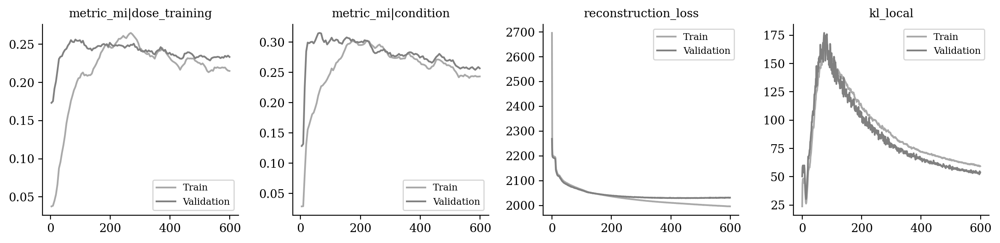

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|dose_training", "metric_mi|condition", 
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

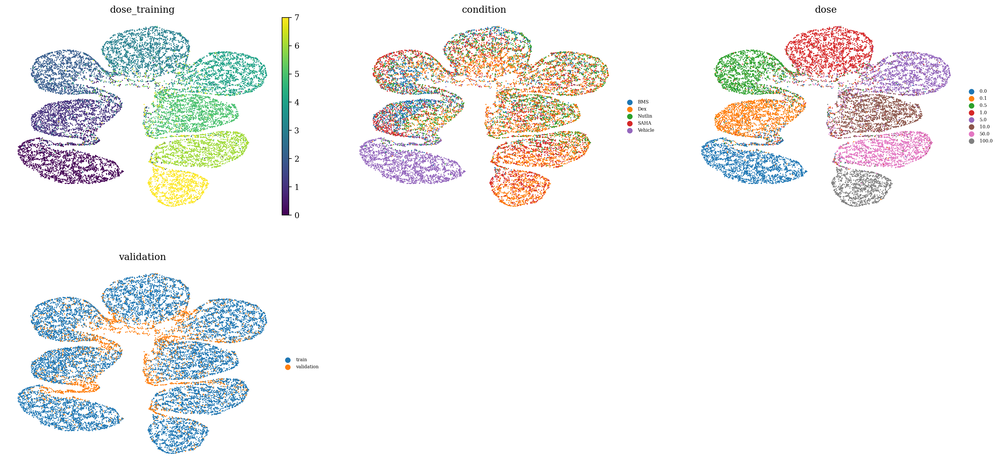

In [13]:
sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

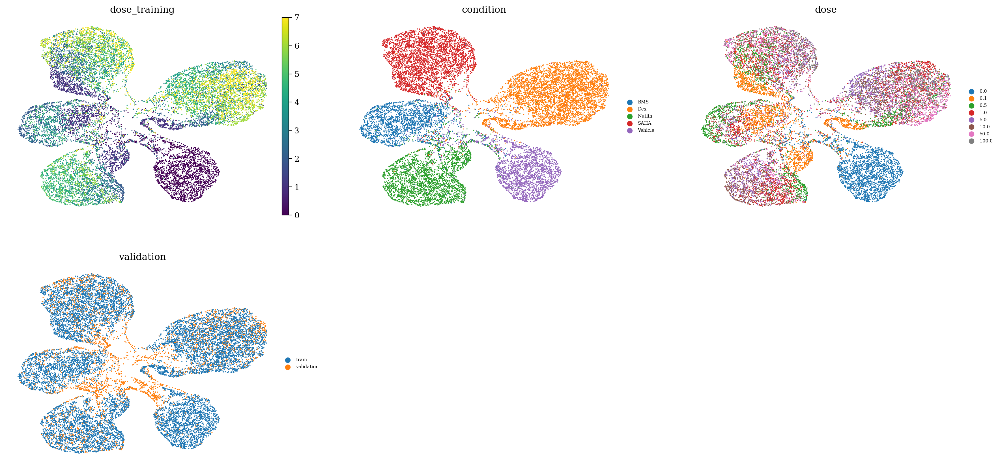

In [14]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

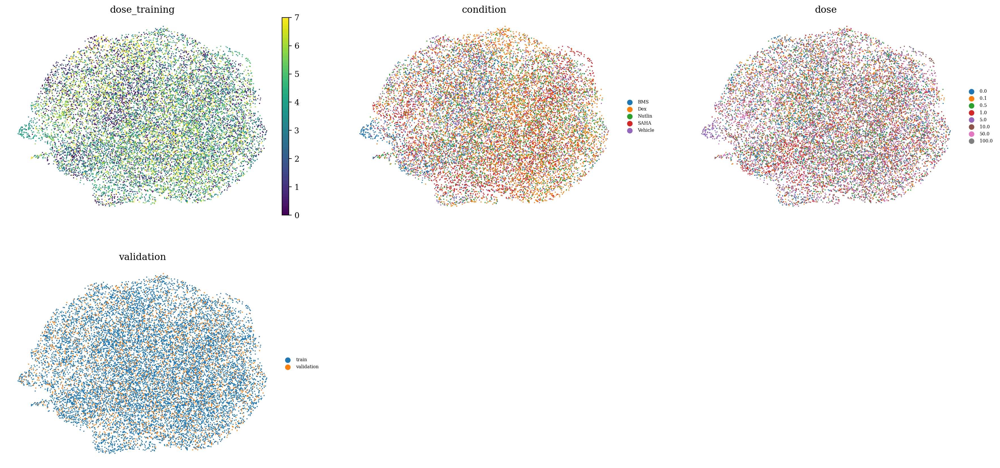

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

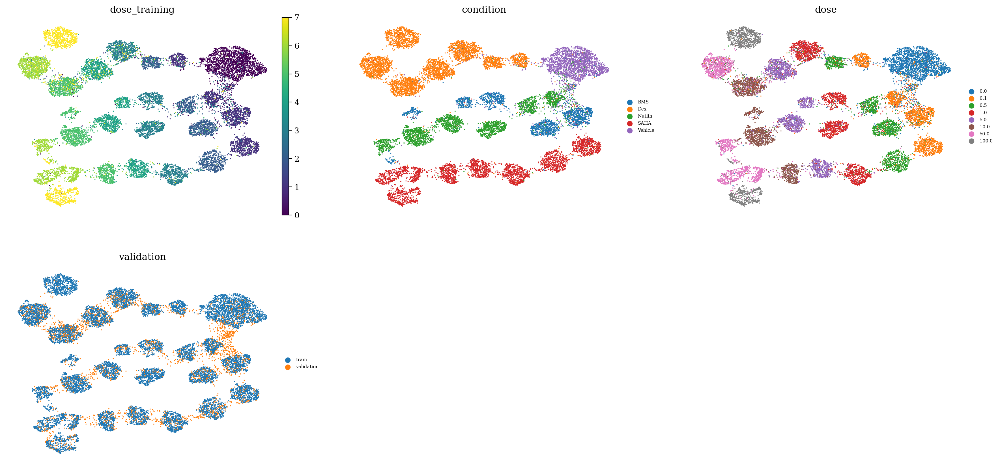

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [17]:
1

1